# EMERSON 

### Code to draw a unnormalised heatmap, set up for the Emerson repertoires (HLA annotation and CMV status possible)

- Original code from Heatmaps_idh.ipynb, under --- PROBLEMATIC HEATMAP ---
- Fully customisable: change 'high conf' to choose which TCR list to screen against Emerson. 

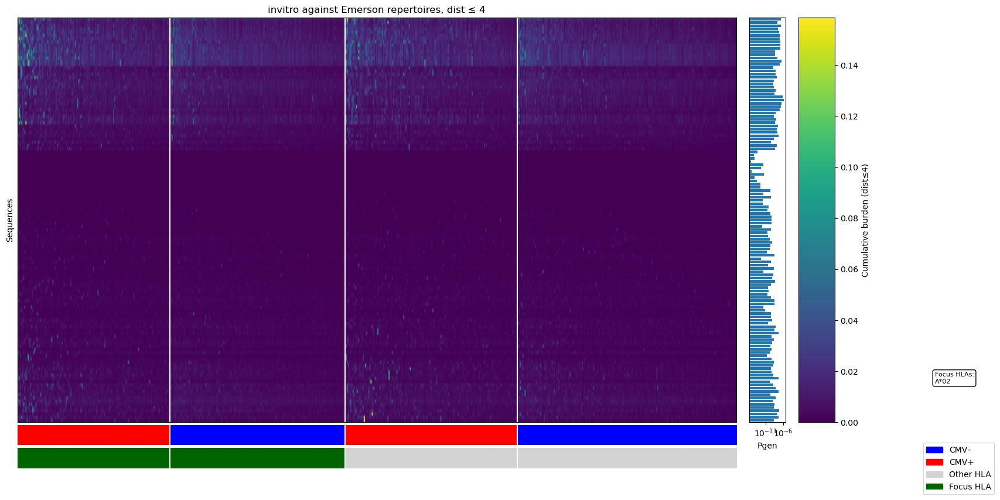

In [6]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob

# ─────────────── CONFIGURATION ───────────────
max_dist       = 4
focus_alleles = ['A*02']
highconf       = 'invitro'
root_dir       = f'/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/{highconf}_emerson_top10000'
matrix_file    = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
pgen_file      = f'all_{highconf}.tsv'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── LOAD METADATA & FILTER VALID PATIENTS ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")

filtered = metadata[
     metadata['sample_name'].str.startswith('P') &
     metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)]


if filtered.empty:
    raise ValueError("No metadata rows match your CMV/sample_name filters.")

# Build CMV map with '.tsv' suffix
cmv_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tag = row['sample_tags']
    if 'Cytomegalovirus +' in tag:
        cmv_map[pid] = 1
    elif 'Cytomegalovirus -' in tag:
        cmv_map[pid] = 0

# Build HLA focus map 
hla_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tags = row['sample_tags']
    hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))

# ─────────────── LOAD BURDEN MATRIX & FILTER TO VALID PATIENTS ───────────────
df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

df = df[[pid for pid in df.columns if pid in cmv_map]]
if df.shape[1] == 0:
    raise ValueError("No patients left after filtering by metadata.")

# ─────────────── ORDER COLUMNS BY HIERARCHICAL GROUPING & BURDEN ───────────────
total_burden = df.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()

focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==1]
focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==0]
other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==1]
other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==0]

ordered_cols = focus_pos + focus_neg + other_pos + other_neg
df = df[ordered_cols]

# Build annotation strips
status_strip = [cmv_map[pid] for pid in ordered_cols]
hla_strip    = [hla_map.get(pid,0) for pid in ordered_cols]

# ─────────────── MERGE PGEN VALUES ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, pgen_file)):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())

# ─────────────── CLUSTER SEQUENCES ───────────────
dist_rows   = pdist(df.values, metric='euclidean')
Z_rows      = linkage(dist_rows, method='average')
leaf_order  = dendrogram(Z_rows, no_plot=True)['leaves']
df          = df.iloc[leaf_order, :]
pgen_array  = [pgen_map.get(seq, np.nan) for seq in df.index]

# ─────────────── PLOTTING ───────────────
fig = plt.figure(figsize=(18,11))
gs  = fig.add_gridspec(3,3,
    height_ratios=[20,1,1],
    width_ratios =[20,1,1],
    hspace=0.02, wspace=0.05)

ax_heat = fig.add_subplot(gs[0,0])
ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
ax_cbar = fig.add_subplot(gs[0,2])
ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

# Heatmap
imshow_kwargs = dict(aspect='auto', cmap='viridis')
if df.values.size:
    imshow_kwargs.update(vmin=df.values.min(), vmax=df.values.max())
im = ax_heat.imshow(df.values, **imshow_kwargs)
fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')
ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
ax_heat.set_title(f'{highconf} against Emerson repertoires, dist ≤ {max_dist}')
ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

# Pgen bar
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

# CMV strip
cmap_cmv = ListedColormap(['blue','red'])
ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto',
              cmap=cmap_cmv, vmin=0, vmax=1)
ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False)
ax_cmv.set_xticks([])

# HLA strip
cmap_hla = ListedColormap(['lightgrey','darkgreen'])
ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto',
              cmap=cmap_hla, vmin=0, vmax=1)
ax_hla.set_yticks([]); ax_hla.set_frame_on(False)
#ax_hla.set_xticks(range(len(ordered_cols)))
#ax_hla.set_xticklabels(ordered_cols, rotation=45, ha='right', fontsize=6)
ax_hla.set_xticks([])
ax_hla.tick_params(axis='x', length=0)

# Dividers
cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
for c in cuts[:-1]:
    for ax in (ax_heat, ax_cmv, ax_hla):
        ax.axvline(c-0.5, color='white', lw=1.5)

# Legend
leg_cmv = [
    mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
    mpatches.Patch(color=cmap_cmv(1), label='CMV+')
]
leg_hla = [
    mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
    mpatches.Patch(color=cmap_hla(1), label='Focus HLA')
]
fig.legend(handles=leg_cmv + leg_hla,
           loc='center left', bbox_to_anchor=(0.98,0.2))

fig.subplots_adjust(top=0.9, bottom=0.2, right=0.9)

# Add box showing which focus HLAs
focus_hla_text = "Focus HLAs:\n" + "\n".join(focus_alleles)
fig.text(0.995, 0.35, focus_hla_text,
         fontsize=8, va='top', ha='left',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))


plt.show()

##### With burden strip
- Ignore this for now, can't actually remember what a burden strip is

In [28]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob

# ─────────────── CONFIGURATION ───────────────
max_dist       = 4
focus_alleles  = ['A*02']
root_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/vatcr_emerson'
matrix_file    = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
pgen_file      = 'WITHOUTEBV_pgen_output.tsv'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── LOAD METADATA & FILTER VALID PATIENTS ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")

filtered = metadata[
    metadata['sample_name'].str.startswith('P') &
    metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
]

if filtered.empty:
    raise ValueError("No metadata rows match your CMV/sample_name filters.")

# Build CMV map with '.tsv' suffix
cmv_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tag = row['sample_tags']
    if 'Cytomegalovirus +' in tag:
        cmv_map[pid] = 1
    elif 'Cytomegalovirus -' in tag:
        cmv_map[pid] = 0

# Build HLA focus map 
hla_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tags = row['sample_tags']
    hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))

# ─────────────── LOAD BURDEN MATRIX & FILTER TO VALID PATIENTS ───────────────
df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

df = df[[pid for pid in df.columns if pid in cmv_map]]
if df.shape[1] == 0:
    raise ValueError("No patients left after filtering by metadata.")

# ─────────────── ORDER COLUMNS BY HIERARCHICAL GROUPING & BURDEN ───────────────
total_burden = df.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()

focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==1]
focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==0]
other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==1]
other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==0]

ordered_cols = focus_pos + focus_neg + other_pos + other_neg
df = df[ordered_cols]

# Build annotation strips
status_strip = [cmv_map[pid] for pid in ordered_cols]
hla_strip    = [hla_map.get(pid,0) for pid in ordered_cols]

# ─────────────── MERGE PGEN VALUES ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, pgen_file)):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())

# ─────────────── CLUSTER SEQUENCES ───────────────
dist_rows   = pdist(df.values, metric='euclidean')
Z_rows      = linkage(dist_rows, method='average')
leaf_order  = dendrogram(Z_rows, no_plot=True)['leaves']
df          = df.iloc[leaf_order, :]
pgen_array  = [pgen_map.get(seq, np.nan) for seq in df.index]

# ─────────────── PLOTTING ───────────────

# ─── ADJUST GRIDSPEC FOR 4 ROWS ───
fig = plt.figure(figsize=(18,11))
gs  = fig.add_gridspec(4, 3,
    height_ratios=[20, 1, 1, 1],
    width_ratios =[20, 1, 1],
    hspace=0.02, wspace=0.05)

ax_heat    = fig.add_subplot(gs[0, 0])
ax_pgen    = fig.add_subplot(gs[0, 1], sharey=ax_heat)
ax_cbar    = fig.add_subplot(gs[0, 2])
ax_burden  = fig.add_subplot(gs[1, 0], sharex=ax_heat)    # BURDEN BAR goes here
ax_cmv     = fig.add_subplot(gs[2, 0], sharex=ax_heat)
ax_hla     = fig.add_subplot(gs[3, 0], sharex=ax_heat)

# Heatmap
imshow_kwargs = dict(aspect='auto', cmap='viridis')
if df.values.size:
    imshow_kwargs.update(vmin=df.values.min(), vmax=df.values.max())
im = ax_heat.imshow(df.values, **imshow_kwargs)
fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')
ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
ax_heat.set_title(f'AC02 CMV-associated sequences against Emerson repertoires, dist ≤ {max_dist}')
ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

# Pgen bar
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

# ─── BUILD AND PLOT BURDEN BAR CHART ───
burden_heatmap = np.array(total_burden_sorted)[None, :]
cmap_burden = plt.get_cmap('plasma')
im_burden = ax_burden.imshow(burden_heatmap, aspect='auto', cmap=cmap_burden)
ax_burden.set_yticks([])
ax_burden.set_xticks([])
ax_burden.set_frame_on(False)
# Colorbar for burden heatmap
cbar_burden = fig.add_axes([0.99, 0.4, 0.01, 0.05])  # [left, bottom, width, height]
fig.colorbar(im_burden, cax=cbar_burden, orientation='vertical', label='Total burden')



# CMV strip
cmap_cmv = ListedColormap(['blue','red'])
ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto',
              cmap=cmap_cmv, vmin=0, vmax=1)
ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False)
ax_cmv.set_xticks([])

# HLA strip
cmap_hla = ListedColormap(['lightgrey','darkgreen'])
ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto',
              cmap=cmap_hla, vmin=0, vmax=1)
ax_hla.set_yticks([]); ax_hla.set_frame_on(False)
ax_hla.set_xticks([])
ax_hla.tick_params(axis='x', length=0)

# ─── ADJUST DIVIDERS TO INCLUDE BURDEN BAR ───
cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
for c in cuts[:-1]:
    for ax in (ax_heat, ax_burden, ax_cmv, ax_hla):
        ax.axvline(c-0.5, color='white', lw=1.5)

# Legend
leg_cmv = [
    mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
    mpatches.Patch(color=cmap_cmv(1), label='CMV+')
]
leg_hla = [
    mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
    mpatches.Patch(color=cmap_hla(1), label='Focus HLA')
]
fig.legend(handles=leg_cmv + leg_hla,
           loc='center left', bbox_to_anchor=(0.98,0.2))

fig.subplots_adjust(top=0.9, bottom=0.2, right=0.9)

# Add box showing which focus HLAs
focus_hla_text = "Focus HLAs:\n" + "\n".join(focus_alleles)
fig.text(0.995, 0.35, focus_hla_text,
         fontsize=8, va='top', ha='left',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

plt.show()


NameError: name 'total_burden_sorted' is not defined

Error in callback <function _draw_all_if_interactive at 0x119b92020> (for post_execute), with arguments args (),kwargs {}:


ValueError: Data has no positive values, and therefore cannot be log-scaled.

ValueError: Data has no positive values, and therefore cannot be log-scaled.

<Figure size 1800x1100 with 6 Axes>

In [36]:
total_burden

patient_id
P00605.tsv    11.325752
P00381.tsv     7.683481
P00527.tsv     7.631656
P00570.tsv     7.278790
P00085.tsv     7.239817
                ...    
P00355.tsv     3.317655
P00608.tsv     3.249028
P00628.tsv     3.007612
P00005.tsv     2.935545
P00446.tsv     2.920763
Length: 640, dtype: float64

### Summary statistics for the above heatmap
- table of data as well as some plots

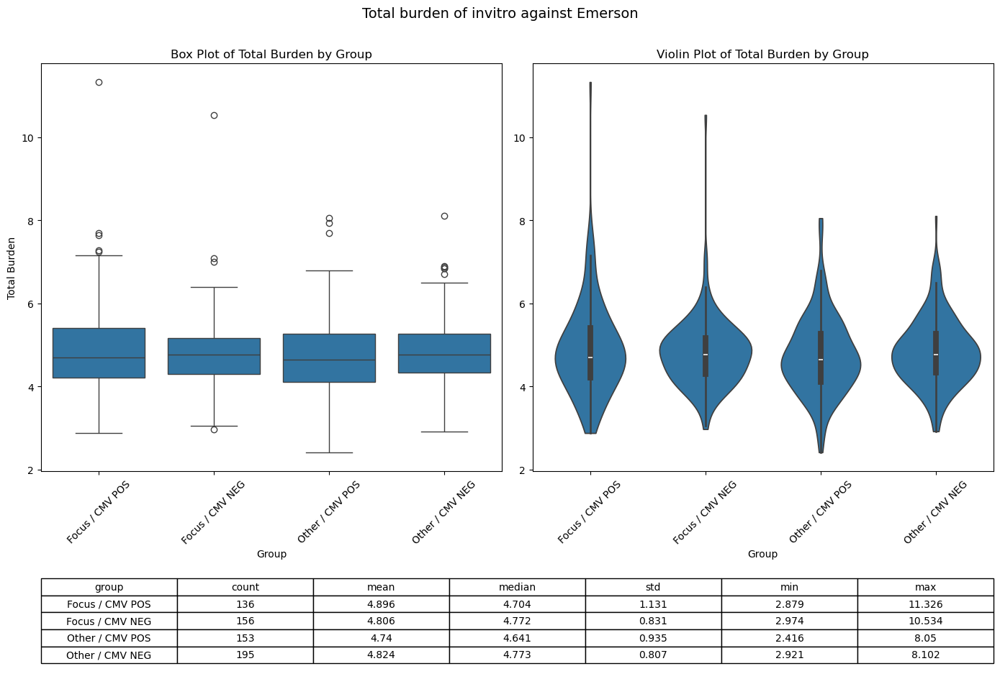

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import gridspec

# ─────────────── COMPUTE TOTAL BURDEN ───────────────
total_burden = df.sum(axis=0)

# ─────────────── BUILD SUMMARY DATAFRAME ───────────────
summary = pd.DataFrame({
    'patient_id':    total_burden.index,
    'total_burden':  total_burden.values,
})
summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'pos' if cmv_map[pid] == 1 else 'neg')
summary['hla_group']  = summary['patient_id'].map(lambda pid: 'focus' if hla_map.get(pid, 0) == 1 else 'other')
summary['group'] = summary['hla_group'].str.capitalize() + ' / CMV ' + summary['cmv_status'].str.upper()

# ─────────────── DEFINE CUSTOM ORDER ───────────────
group_order = ['Focus / CMV POS', 'Focus / CMV NEG', 'Other / CMV POS', 'Other / CMV NEG']
summary['group'] = pd.Categorical(summary['group'], categories=group_order, ordered=True)

# ─────────────── DESCRIPTIVE STATS ───────────────
stats = summary.groupby('group', observed=True)['total_burden'].agg(
    count='count',
    mean='mean',
    median='median',
    std='std',
    min='min',
    max='max'
).reset_index()

stats_display = stats.copy()
stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

# ─────────────── COMPUTE AUTO LIMITS FOR SHARED Y ───────────────
vals = summary['total_burden'].dropna().to_numpy()
if vals.size:
    y_min, y_max = float(np.min(vals)), float(np.max(vals))
    pad = 0.05 * (y_max - y_min) if y_max > y_min else max(1e-6, abs(y_min) * 0.05)
    y_lo, y_hi = y_min - pad, y_max + pad
else:
    y_lo, y_hi = 0, 1

# ─────────────── CREATE FIGURE WITH EXTRA ROW FOR TABLE ───────────────
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])  # 2 rows: plots (4x height) + table (1x height)

# Plot axes
ax_box    = fig.add_subplot(gs[0, 0])
ax_violin = fig.add_subplot(gs[0, 1], sharey=ax_box)
ax_table  = fig.add_subplot(gs[1, :])  # table spans both columns

# ─────────────── PLOTS ───────────────
sns.boxplot(data=summary, x='group', y='total_burden', order=group_order, ax=ax_box)
ax_box.set_ylim(y_lo, y_hi)
ax_box.set_title('Box Plot of Total Burden by Group')
ax_box.set_xlabel('Group')
ax_box.set_ylabel('Total Burden')
ax_box.tick_params(axis='x', rotation=45)

sns.violinplot(data=summary, x='group', y='total_burden', order=group_order,
               cut=0, inner='box', ax=ax_violin)
ax_violin.set_ylim(y_lo, y_hi)
ax_violin.set_title(f'Violin Plot of Total Burden by Group')
ax_violin.set_xlabel('Group')
ax_violin.set_ylabel('')
ax_violin.tick_params(axis='x', rotation=45)

# ─────────────── TABLE ───────────────
ax_table.axis('off')  # hide the table subplot axes
table = ax_table.table(
    cellText=stats_display.values,
    colLabels=stats_display.columns,
    cellLoc='center',
    loc='center'
)
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 1.4)  # widen columns, make rows taller

# ─────────────── TITLE & LAYOUT ───────────────
plt.suptitle(f'Total burden of {highconf} against Emerson', fontsize=14, y=0.94)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


### All 3 highconfs heatmap and summary stats


=== INVITRO ===


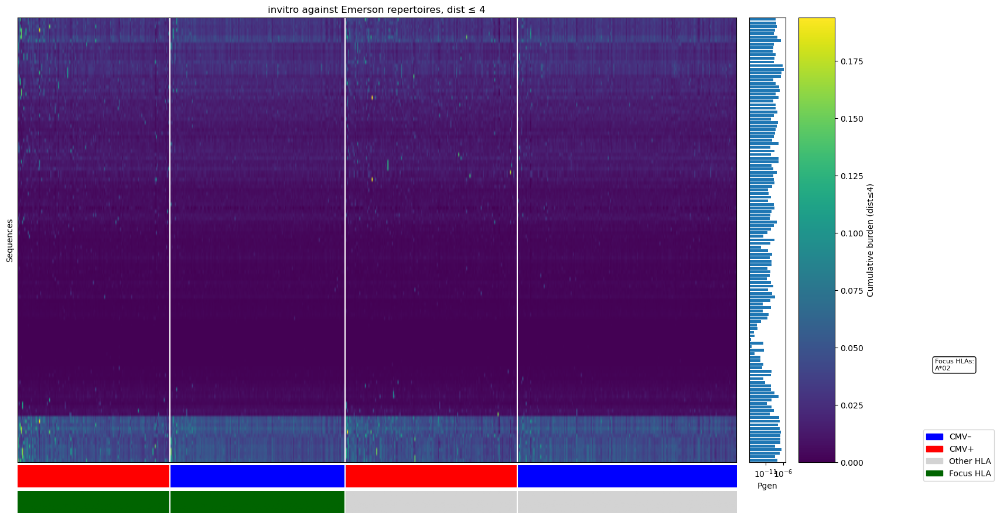

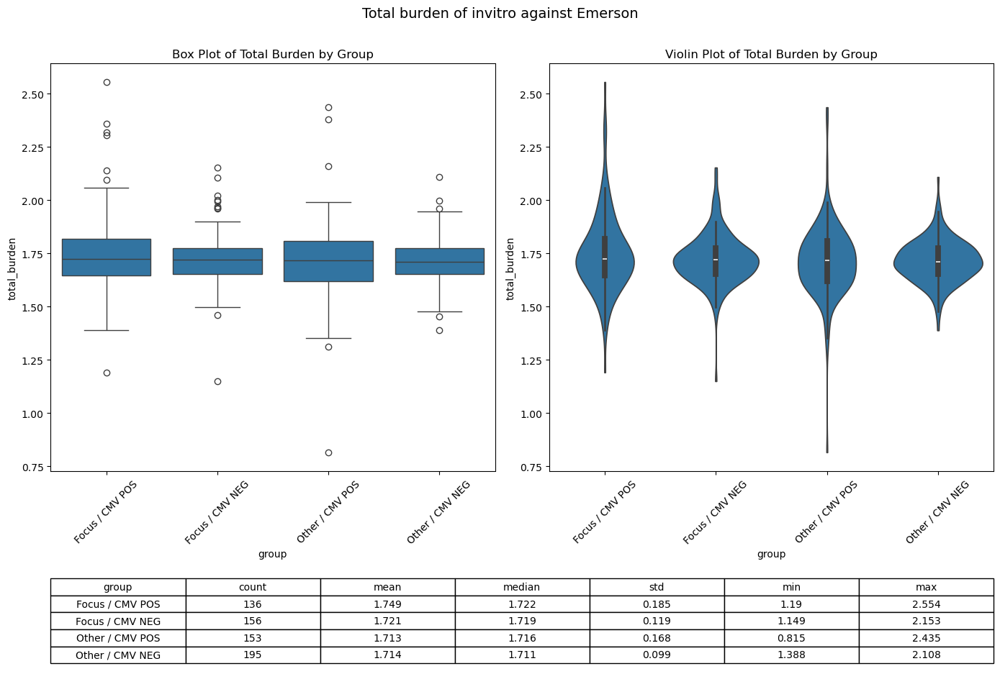


=== VATCR ===


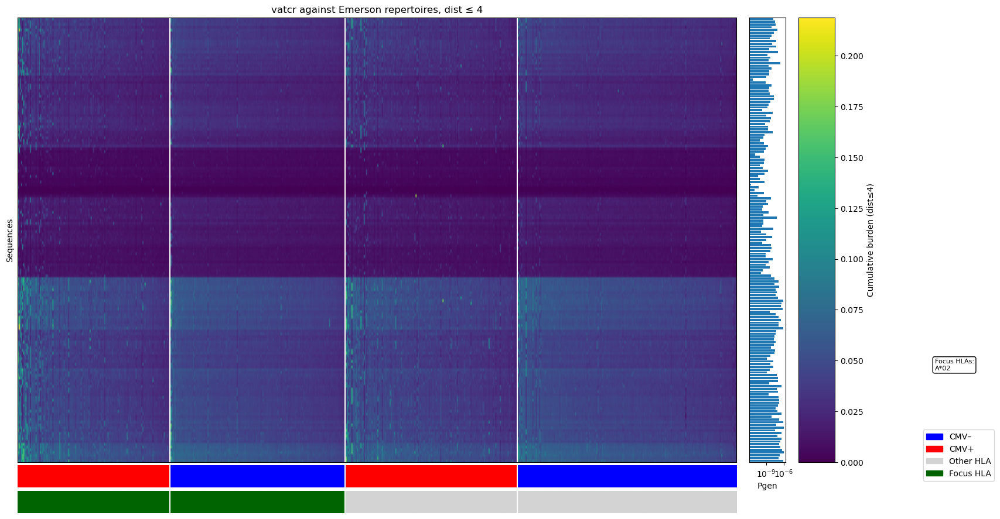

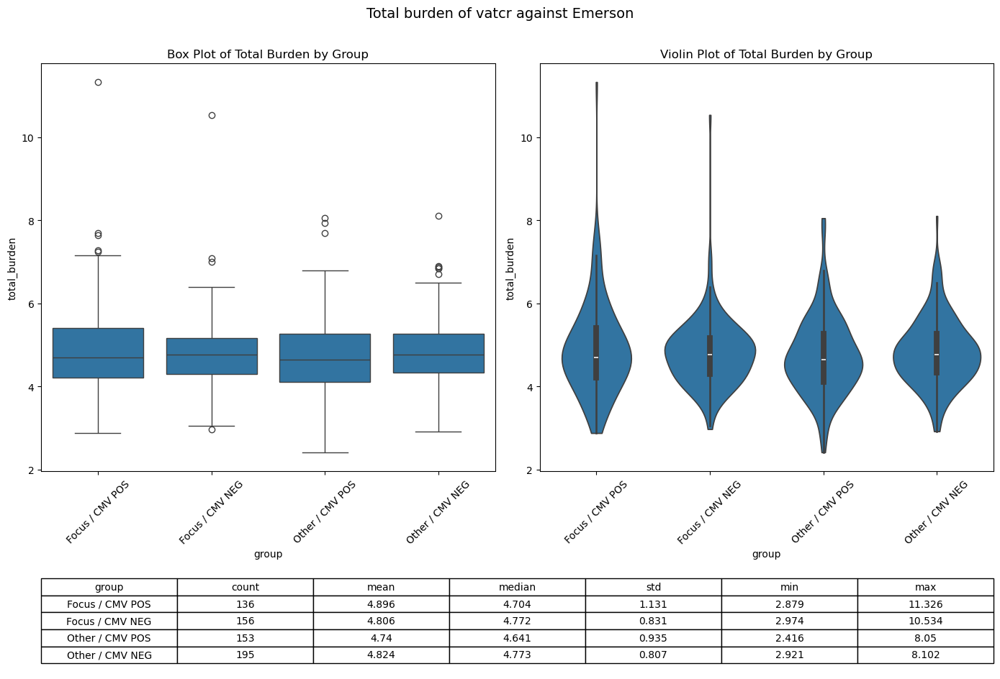


=== AC02 ===


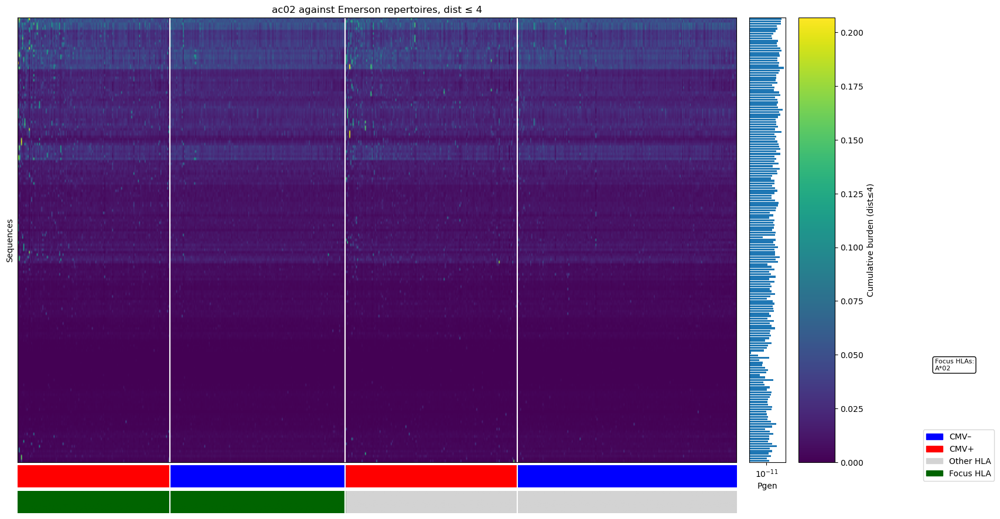

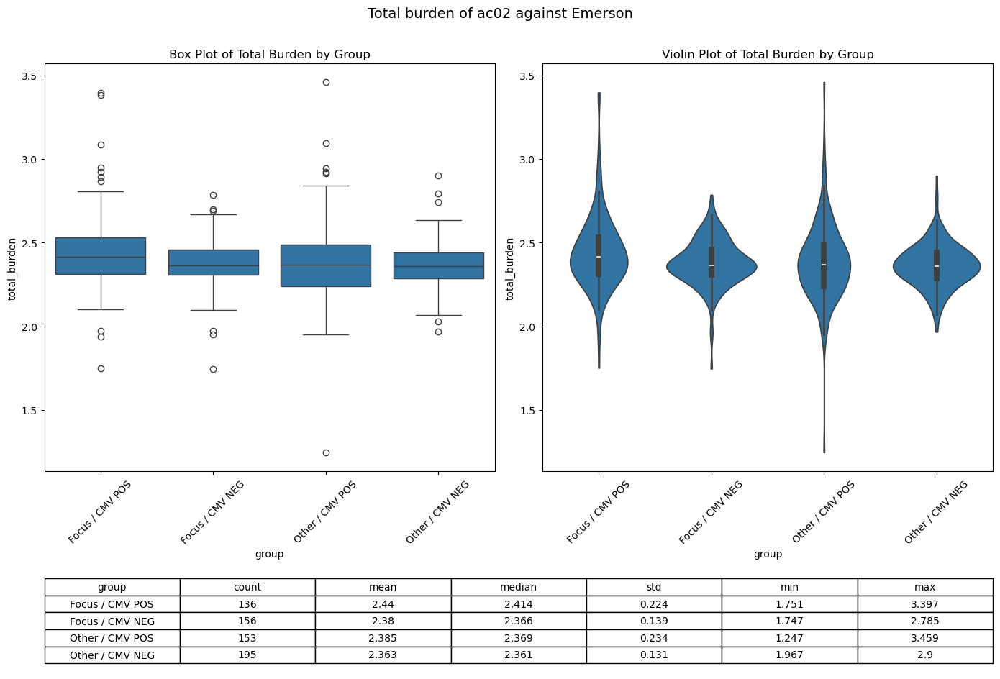


=== RANDOM ===


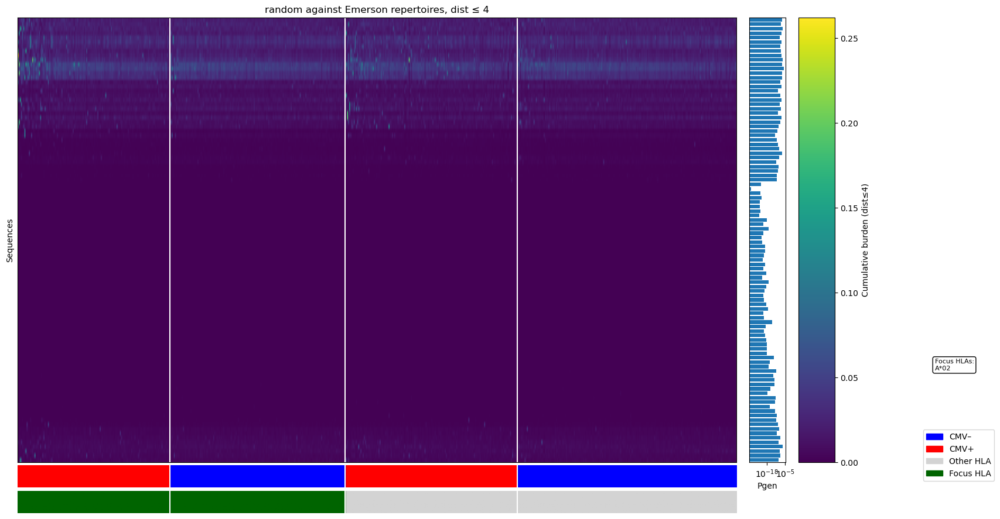

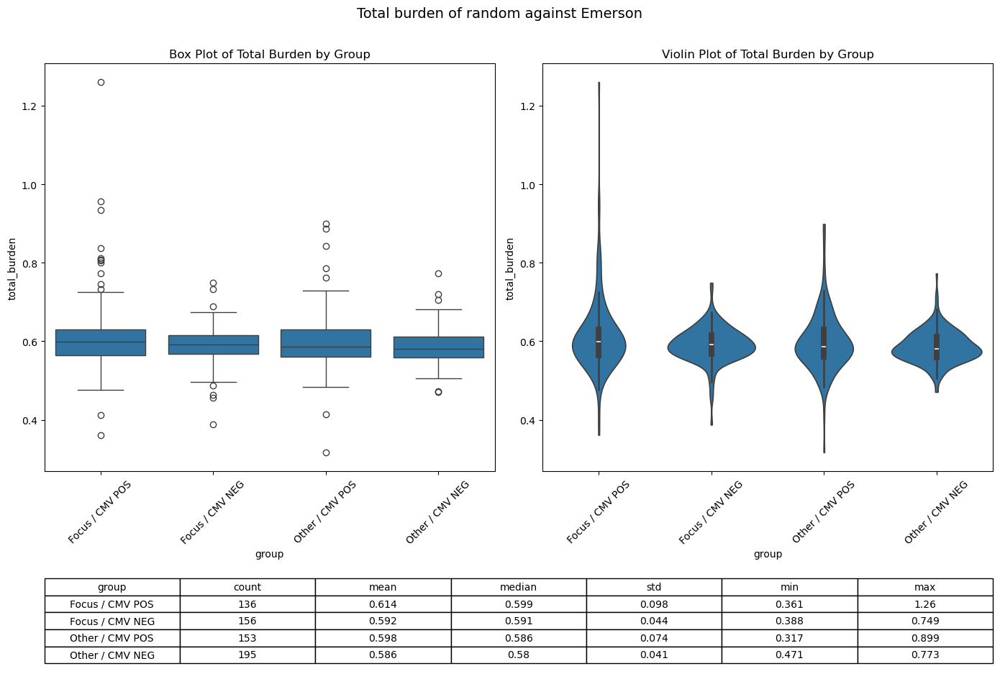

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob
import seaborn as sns
from matplotlib import gridspec

# ─────────────── CONFIG ───────────────
max_dist       = 4
focus_alleles  = ['A*02']
highconf_list  = ['invitro', 'vatcr', 'ac02', 'random100']

base_heat_dir  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output'
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── HELPERS ───────────────
def build_maps(metadata_path, focus_alleles):
    metadata = pd.read_csv(metadata_path, sep="\t")
    filtered = metadata[
        metadata['sample_name'].str.startswith('P') &
        metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
    ]
    if filtered.empty:
        raise ValueError("No metadata rows match CMV/sample_name filters.")

    cmv_map, hla_map = {}, {}
    for _, row in filtered.iterrows():
        pid  = row['sample_name'] + '.tsv'
        tags = row['sample_tags']
        if 'Cytomegalovirus +' in tags:
            cmv_map[pid] = 1
        elif 'Cytomegalovirus -' in tags:
            cmv_map[pid] = 0
        hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))
    return cmv_map, hla_map

def load_burden_matrix(root_dir, max_dist):
    matrix_file = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
    df = pd.read_csv(matrix_file, index_col='patient_id').T
    return df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

def load_pgen_map(pgen_dir, highconf):
    pgen_file = os.path.join(pgen_dir, f'all_{highconf}.tsv')
    sub_df = pd.read_csv(pgen_file, sep='\t').set_index('Sequence')
    return sub_df['Pgen'].to_dict()

def order_columns(df, cmv_map, hla_map):
    total_burden = df.sum(axis=0)
    burden_sorted = total_burden.sort_values(ascending=False).index.tolist()
    focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==1]
    focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==0]
    other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==1]
    other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==0]
    ordered_cols = focus_pos + focus_neg + other_pos + other_neg
    return ordered_cols, (focus_pos, focus_neg, other_pos, other_neg)

def plot_heatmap(df, cmv_map, hla_map, pgen_map, max_dist, highconf, focus_alleles, ordered_blocks):
    ordered_cols = df.columns.tolist()
    status_strip = [cmv_map[c] for c in ordered_cols]
    hla_strip    = [hla_map.get(c,0) for c in ordered_cols]

    if df.shape[0] >= 2:
        dist_rows   = pdist(df.values, metric='euclidean')
        Z_rows      = linkage(dist_rows, method='average')
        leaf_order  = dendrogram(Z_rows, no_plot=True)['leaves']
        df_plot     = df.iloc[leaf_order, :]
    else:
        df_plot = df

    pgen_array = [pgen_map.get(seq, np.nan) for seq in df_plot.index]

    fig = plt.figure(figsize=(18,11))
    gs  = fig.add_gridspec(3,3, height_ratios=[20,1,1], width_ratios =[20,1,1], hspace=0.02, wspace=0.05)
    ax_heat = fig.add_subplot(gs[0,0])
    ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
    ax_cbar = fig.add_subplot(gs[0,2])
    ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
    ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

    imshow_kwargs = dict(aspect='auto', cmap='viridis')
    if df_plot.values.size:
        imshow_kwargs.update(vmin=df_plot.values.min(), vmax=df_plot.values.max())
    im = ax_heat.imshow(df_plot.values, **imshow_kwargs)
    fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')
    ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
    ax_heat.set_title(f'{highconf} against Emerson repertoires, dist ≤ {max_dist}')
    ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

    ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
    ax_pgen.invert_yaxis()
    ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

    cmap_cmv = ListedColormap(['blue','red'])
    ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto', cmap=cmap_cmv, vmin=0, vmax=1)
    ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False); ax_cmv.set_xticks([])

    cmap_hla = ListedColormap(['lightgrey','darkgreen'])
    ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto', cmap=cmap_hla, vmin=0, vmax=1)
    ax_hla.set_yticks([]); ax_hla.set_frame_on(False); ax_hla.set_xticks([])

    focus_pos, focus_neg, other_pos, other_neg = ordered_blocks
    cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
    for c in cuts[:-1]:
        for ax in (ax_heat, ax_cmv, ax_hla):
            ax.axvline(c-0.5, color='white', lw=1.5)

    leg_cmv = [mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
               mpatches.Patch(color=cmap_cmv(1), label='CMV+')]
    leg_hla = [mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
               mpatches.Patch(color=cmap_hla(1), label='Focus HLA')]
    fig.legend(handles=leg_cmv + leg_hla, loc='center left', bbox_to_anchor=(0.98,0.2))
    fig.text(0.995, 0.35, "Focus HLAs:\n" + "\n".join(focus_alleles),
             fontsize=8, va='top', ha='left',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    plt.show()

def plot_summary_panel(df, cmv_map, hla_map, highconf):
    total_burden = df.sum(axis=0)
    summary = pd.DataFrame({'patient_id': total_burden.index, 'total_burden': total_burden.values})
    summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'pos' if cmv_map[pid] == 1 else 'neg')
    summary['hla_group']  = summary['patient_id'].map(lambda pid: 'focus' if hla_map.get(pid, 0) == 1 else 'other')
    summary['group'] = summary['hla_group'].str.capitalize() + ' / CMV ' + summary['cmv_status'].str.upper()
    group_order = ['Focus / CMV POS', 'Focus / CMV NEG', 'Other / CMV POS', 'Other / CMV NEG']
    summary['group'] = pd.Categorical(summary['group'], categories=group_order, ordered=True)

    stats = summary.groupby('group', observed=True)['total_burden'].agg(
        count='count', mean='mean', median='median', std='std', min='min', max='max'
    ).reset_index()
    stats_display = stats.copy()
    stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    vals = summary['total_burden'].dropna().to_numpy()
    y_lo, y_hi = (vals.min() - 0.05*(vals.max()-vals.min()), vals.max() + 0.05*(vals.max()-vals.min())) if vals.size else (0, 1)

    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])
    ax_box    = fig.add_subplot(gs[0, 0])
    ax_violin = fig.add_subplot(gs[0, 1], sharey=ax_box)
    ax_table  = fig.add_subplot(gs[1, :])

    sns.boxplot(data=summary, x='group', y='total_burden', order=group_order, ax=ax_box)
    ax_box.set_ylim(y_lo, y_hi)
    ax_box.set_title('Box Plot of Total Burden by Group')
    ax_box.tick_params(axis='x', rotation=45)

    sns.violinplot(data=summary, x='group', y='total_burden', order=group_order, cut=0, inner='box', ax=ax_violin)
    ax_violin.set_ylim(y_lo, y_hi)
    ax_violin.set_title('Violin Plot of Total Burden by Group')
    ax_violin.tick_params(axis='x', rotation=45)

    ax_table.axis('off')
    table = ax_table.table(cellText=stats_display.values,
                           colLabels=stats_display.columns,
                           cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.4)
    plt.suptitle(f'Total burden of {highconf} against Emerson', fontsize=14, y=0.94)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

# ─────────────── MAIN LOOP ───────────────
cmv_map_all, hla_map_all = build_maps(metadata_file, focus_alleles)

for highconf in highconf_list:
    print(f"\n=== {highconf.upper()} ===")
    df = load_burden_matrix(os.path.join(base_heat_dir, f'{highconf}_emerson'), max_dist)
    df = df[[pid for pid in df.columns if pid in cmv_map_all]]
    ordered_cols, blocks = order_columns(df, cmv_map_all, hla_map_all)
    df = df[ordered_cols]
    pgen_map = load_pgen_map(pgen_dir, highconf)
    plot_heatmap(df, cmv_map_all, hla_map_all, pgen_map, max_dist, highconf, focus_alleles, blocks)
    plot_summary_panel(df, cmv_map_all, hla_map_all, highconf)


#### Same as above, but ordering by per-TCR burden, not clustering


=== INVITRO ===


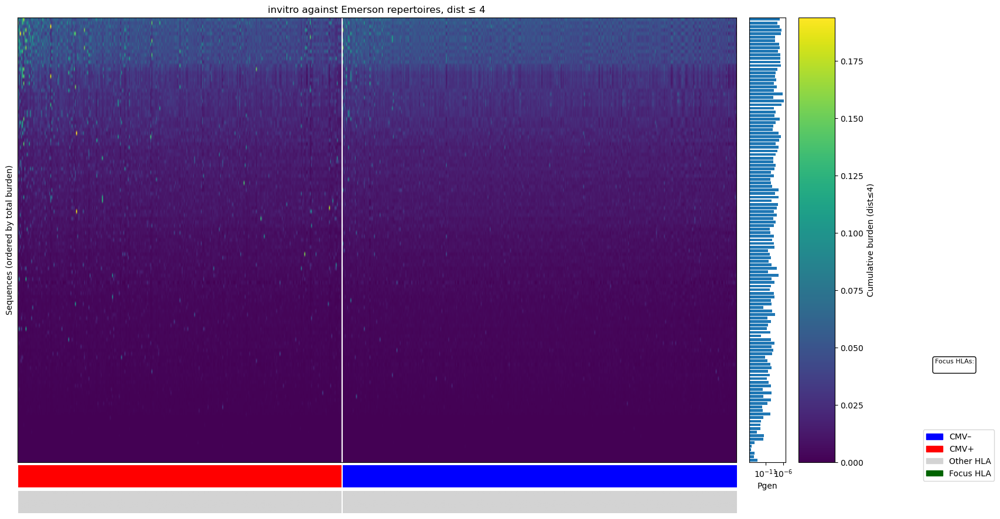

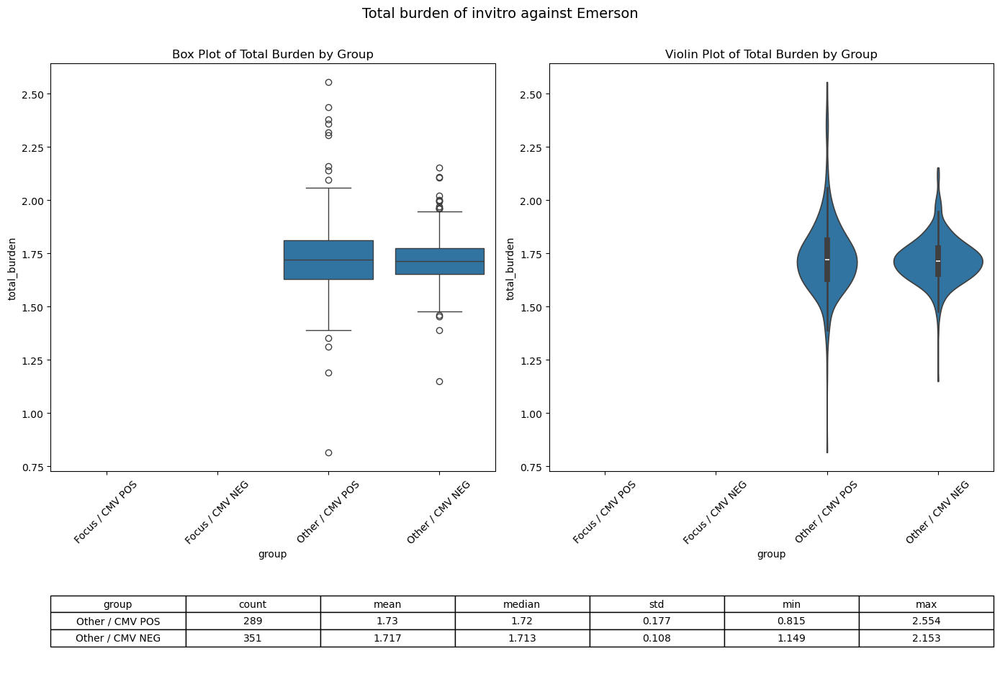


=== VATCR ===


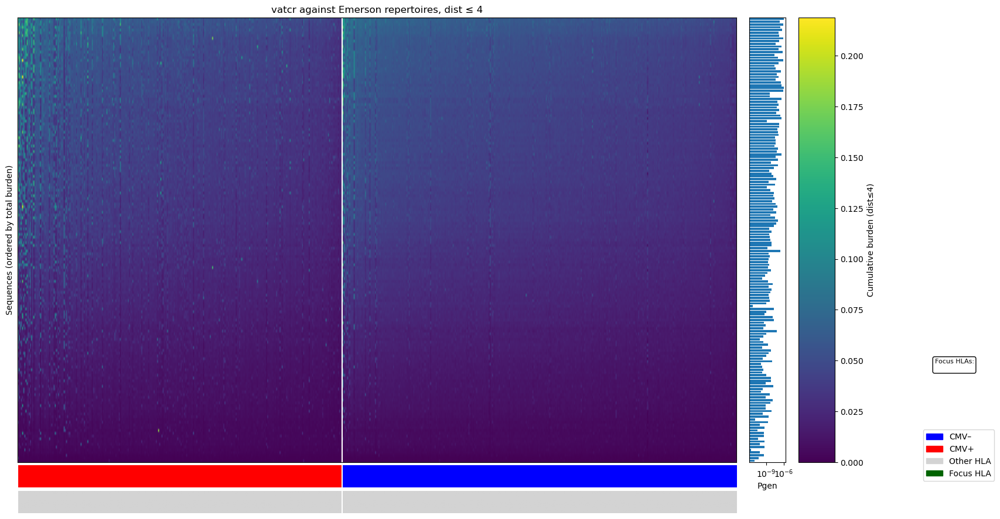

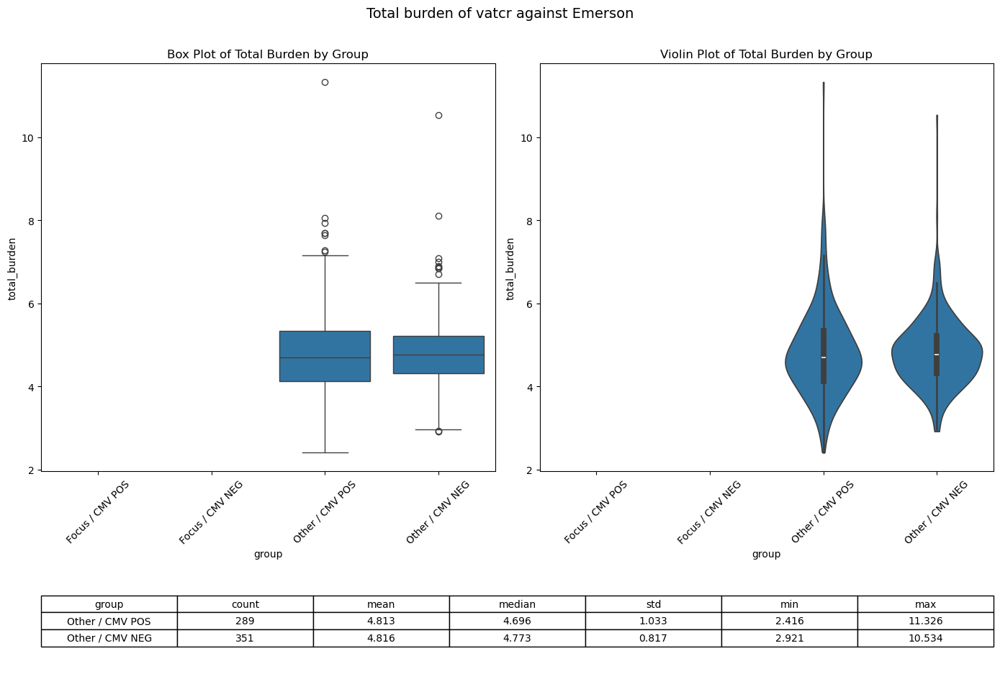


=== AC02 ===


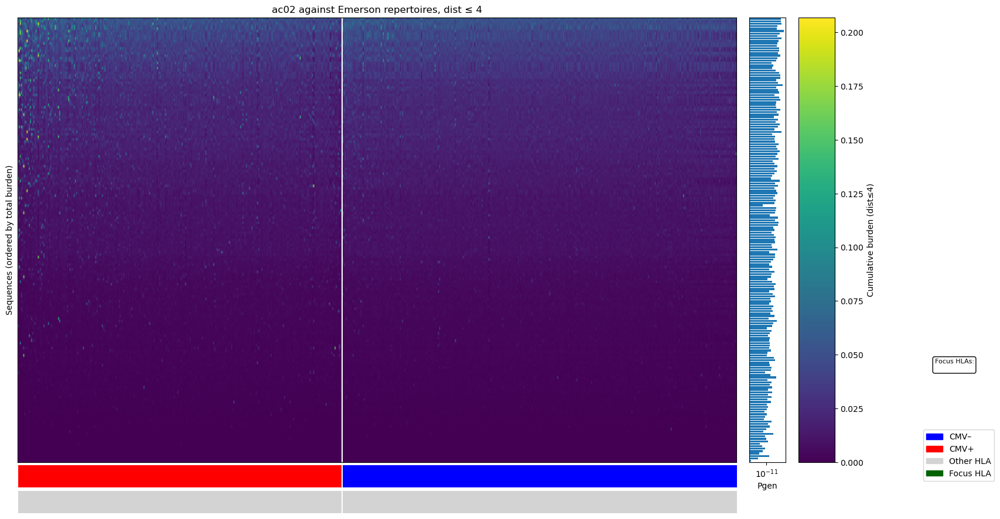

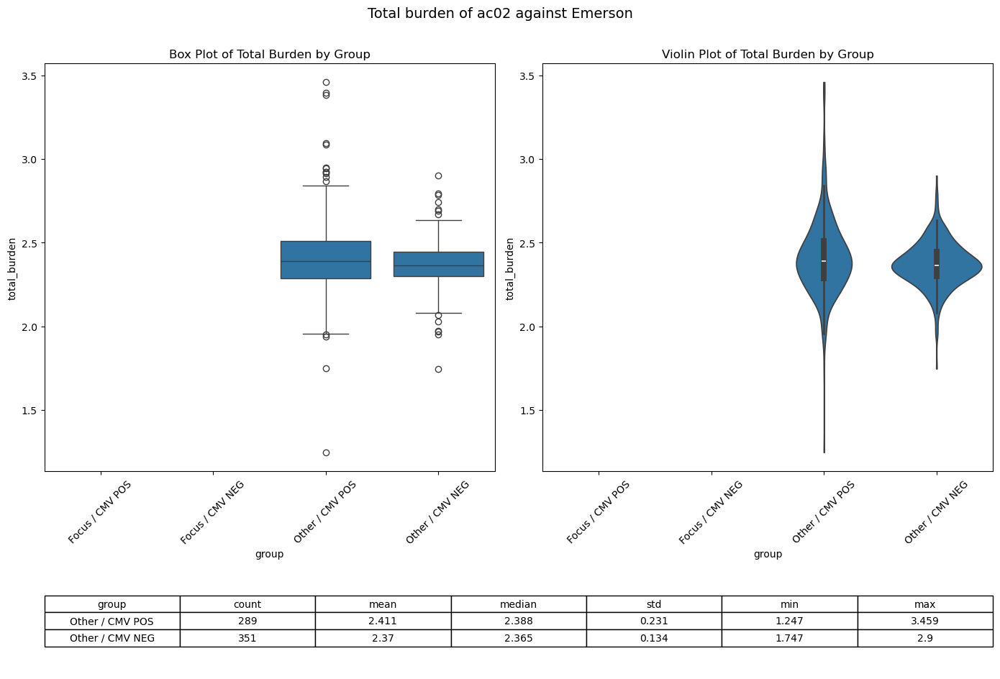


=== RANDOM ===


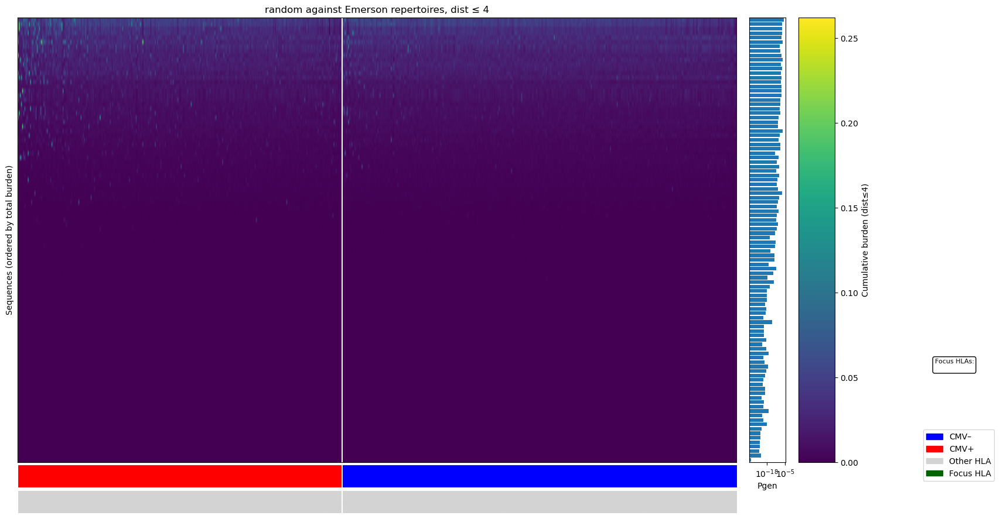

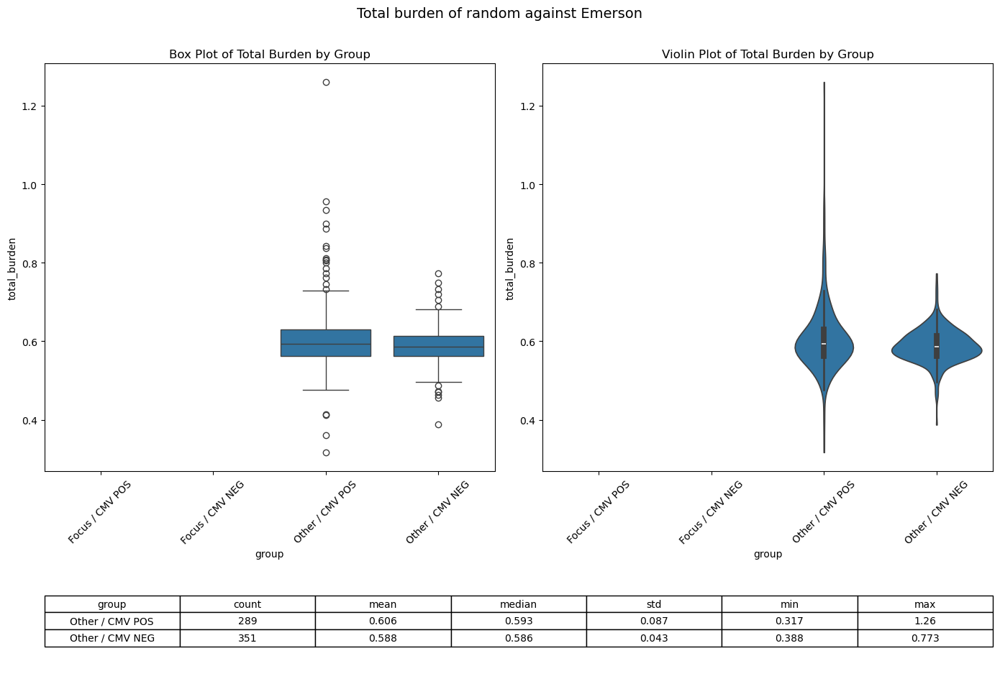

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
# removed: from scipy.cluster.hierarchy import linkage, dendrogram
# removed: from scipy.spatial.distance import pdist
from glob import glob
import seaborn as sns
from matplotlib import gridspec

# ─────────────── CONFIG ───────────────
max_dist       = 4
focus_alleles  = []
highconf_list  = ['invitro', 'vatcr', 'ac02', 'random100']

base_heat_dir  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output'
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── HELPERS ───────────────
def build_maps(metadata_path, focus_alleles):
    metadata = pd.read_csv(metadata_path, sep="\t")
    filtered = metadata[
        metadata['sample_name'].str.startswith('P') &
        metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
    ]
    if filtered.empty:
        raise ValueError("No metadata rows match CMV/sample_name filters.")

    cmv_map, hla_map = {}, {}
    for _, row in filtered.iterrows():
        pid  = row['sample_name'] + '.tsv'
        tags = row['sample_tags']
        if 'Cytomegalovirus +' in tags:
            cmv_map[pid] = 1
        elif 'Cytomegalovirus -' in tags:
            cmv_map[pid] = 0
        hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))
    return cmv_map, hla_map

def load_burden_matrix(root_dir, max_dist):
    matrix_file = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
    df = pd.read_csv(matrix_file, index_col='patient_id').T
    return df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

def load_pgen_map(pgen_dir, highconf):
    pgen_file = os.path.join(pgen_dir, f'all_{highconf}.tsv')
    sub_df = pd.read_csv(pgen_file, sep='\t').set_index('Sequence')
    return sub_df['Pgen'].to_dict()

def order_columns(df, cmv_map, hla_map):
    total_burden = df.sum(axis=0)
    burden_sorted = total_burden.sort_values(ascending=False).index.tolist()
    focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==1]
    focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==0]
    other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==1]
    other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==0]
    ordered_cols = focus_pos + focus_neg + other_pos + other_neg
    return ordered_cols, (focus_pos, focus_neg, other_pos, other_neg)

def plot_heatmap(df, cmv_map, hla_map, pgen_map, max_dist, highconf, focus_alleles, ordered_blocks):
    # Columns already ordered outside; keep that order for strips
    ordered_cols = df.columns.tolist()
    status_strip = [cmv_map[c] for c in ordered_cols]
    hla_strip    = [hla_map.get(c,0) for c in ordered_cols]

    # Order rows largest → smallest
    row_totals = df.sum(axis=1)
    row_order  = row_totals.sort_values(ascending=True).index
    df_plot    = df.loc[row_order]  

    # Pgen values aligned to the (re-)ordered rows
    pgen_array = [pgen_map.get(seq, np.nan) for seq in df_plot.index]

    fig = plt.figure(figsize=(18,11))
    gs  = fig.add_gridspec(3,3, height_ratios=[20,1,1], width_ratios =[20,1,1], hspace=0.02, wspace=0.05)
    ax_heat = fig.add_subplot(gs[0,0])
    ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
    ax_cbar = fig.add_subplot(gs[0,2])
    ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
    ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

    imshow_kwargs = dict(aspect='auto', cmap='viridis')
    if df_plot.values.size:
        imshow_kwargs.update(vmin=df_plot.values.min(), vmax=df_plot.values.max())
    im = ax_heat.imshow(df_plot.values, **imshow_kwargs)
    fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')
    ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences (ordered by total burden)')
    ax_heat.set_title(f'{highconf} against Emerson repertoires, dist ≤ {max_dist}')
    ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

    ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
    ax_pgen.invert_yaxis()
    ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

    cmap_cmv = ListedColormap(['blue','red'])
    ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto', cmap=cmap_cmv, vmin=0, vmax=1)
    ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False); ax_cmv.set_xticks([])

    cmap_hla = ListedColormap(['lightgrey','darkgreen'])
    ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto', cmap=cmap_hla, vmin=0, vmax=1)
    ax_hla.set_yticks([]); ax_hla.set_frame_on(False); ax_hla.set_xticks([])

    focus_pos, focus_neg, other_pos, other_neg = ordered_blocks
    cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
    for c in cuts[:-1]:
        for ax in (ax_heat, ax_cmv, ax_hla):
            ax.axvline(c-0.5, color='white', lw=1.5)

    leg_cmv = [mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
               mpatches.Patch(color=cmap_cmv(1), label='CMV+')]
    leg_hla = [mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
               mpatches.Patch(color=cmap_hla(1), label='Focus HLA')]
    fig.legend(handles=leg_cmv + leg_hla, loc='center left', bbox_to_anchor=(0.98,0.2))
    fig.text(0.995, 0.35, "Focus HLAs:\n" + "\n".join(focus_alleles),
             fontsize=8, va='top', ha='left',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    plt.show()

def plot_summary_panel(df, cmv_map, hla_map, highconf):
    total_burden = df.sum(axis=0)
    summary = pd.DataFrame({'patient_id': total_burden.index, 'total_burden': total_burden.values})
    summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'pos' if cmv_map[pid] == 1 else 'neg')
    summary['hla_group']  = summary['patient_id'].map(lambda pid: 'focus' if hla_map.get(pid, 0) == 1 else 'other')
    summary['group'] = summary['hla_group'].str.capitalize() + ' / CMV ' + summary['cmv_status'].str.upper()
    group_order = ['Focus / CMV POS', 'Focus / CMV NEG', 'Other / CMV POS', 'Other / CMV NEG']
    summary['group'] = pd.Categorical(summary['group'], categories=group_order, ordered=True)

    stats = summary.groupby('group', observed=True)['total_burden'].agg(
        count='count', mean='mean', median='median', std='std', min='min', max='max'
    ).reset_index()
    stats_display = stats.copy()
    stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    vals = summary['total_burden'].dropna().to_numpy()
    y_lo, y_hi = (vals.min() - 0.05*(vals.max()-vals.min()), vals.max() + 0.05*(vals.max()-vals.min())) if vals.size else (0, 1)

    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])
    ax_box    = fig.add_subplot(gs[0, 0])
    ax_violin = fig.add_subplot(gs[0, 1], sharey=ax_box)
    ax_table  = fig.add_subplot(gs[1, :])

    sns.boxplot(data=summary, x='group', y='total_burden', order=group_order, ax=ax_box)
    ax_box.set_ylim(y_lo, y_hi)
    ax_box.set_title('Box Plot of Total Burden by Group')
    ax_box.tick_params(axis='x', rotation=45)

    sns.violinplot(data=summary, x='group', y='total_burden', order=group_order, cut=0, inner='box', ax=ax_violin)
    ax_violin.set_ylim(y_lo, y_hi)
    ax_violin.set_title('Violin Plot of Total Burden by Group')
    ax_violin.tick_params(axis='x', rotation=45)

    ax_table.axis('off')
    table = ax_table.table(cellText=stats_display.values,
                           colLabels=stats_display.columns,
                           cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.4)
    plt.suptitle(f'Total burden of {highconf} against Emerson', fontsize=14, y=0.94)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

# ─────────────── MAIN LOOP ───────────────
cmv_map_all, hla_map_all = build_maps(metadata_file, focus_alleles)

for highconf in highconf_list:
    print(f"\n=== {highconf.upper()} ===")
    df = load_burden_matrix(os.path.join(base_heat_dir, f'{highconf}_emerson'), max_dist)
    df = df[[pid for pid in df.columns if pid in cmv_map_all]]
    ordered_cols, blocks = order_columns(df, cmv_map_all, hla_map_all)
    df = df[ordered_cols]
    pgen_map = load_pgen_map(pgen_dir, highconf)
    plot_heatmap(df, cmv_map_all, hla_map_all, pgen_map, max_dist, highconf, focus_alleles, blocks)
    plot_summary_panel(df_norm, cmv_map_all, hla_map_all, highconf)


Which are the most expanded clones?

In [ ]:
# ─────────────── TOP 100 MOST EXPANDED SEQUENCES ───────────────
# Sum across patients for each sequence
sequence_total_burden = df.sum(axis=1)

# Convert to DataFrame for easy viewing/exporting
sequence_total_burden = sequence_total_burden.reset_index()
sequence_total_burden.columns = ['Sequence', 'Total_Burden']

sequence_total_burden = sequence_total_burden.sort_values(by='Total_Burden', ascending=False)

# Save sequences to a CSV file
dir = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/crossreactors'
sequence_total_burden.to_csv(os.path.join(dir, 'vatcr_burden.csv'), index=False)


In [5]:
sequence_total_burden.head(100)

,Sequence,Total_Burden
3,CASSLAGTEAFF,39.392516
2,CASSPGAGTEAFF,38.586392
0,CASSGGRTEAFF,37.895988
5,CASSLGEGTEAFF,37.297183
4,CASSLGPTEAFF,37.285234
...,...,...
120,CASSLEGTGIEAFF,16.237495
126,CASHRAMNTEAFF,16.037188
129,CASIKTANTEAFF,15.492645
136,CASSPTGQGYTEAFF,15.444655


Are the 100 top expanded clones CMV reactors?

In [15]:
import os
import pandas as pd
from rapidfuzz.distance import Levenshtein as L

# ─────────────── CONFIGURATION ───────────────
idh_file     = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/crossreactors/vatcr_totalburden.csv'
highconf_file= '/Users/ishaharris/Projects/TCR/TCR-Isha/data/High_Confidence_CMV_TCR/WITHOUT_EBV_highconf.tsv'
output_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/crossreactors/vatcr_cmv_crossreact.csv'

# ─────────────── LOAD DATA ───────────────
df = pd.read_csv(idh_file)  # columns: Sequence, Total_Burden, …

# Load high-confidence CMV-associated sequences
highconf_df = pd.read_csv(highconf_file, sep='\t')
highconf    = highconf_df['amino_acid'].dropna().unique().tolist()
highconf_set= set(highconf)

# ─────────────── UTILITY: MIN LEVENSHTEIN DISTANCE ───────────────
def min_leven_dist(seq, refs):
    # Returns the minimum Levenshtein distance from seq to any ref
    # (stop early if you hit 0)
    best = None
    for r in refs:
        d = L.distance(seq, r)
        if best is None or d < best:
            best = d
            if best == 0:
                break
    return best

# ─────────────── ANNOTATION ───────────────
# Compute min distance
df['min_leven_dist'] = df['Sequence'].apply(lambda s: min_leven_dist(s, highconf_set))

# Flag for within each threshold
for n in range(5):  # 0 through 4
    df[f'within_dist_{n}'] = df['min_leven_dist'] <= n

# Also a summary “cross-reactor” if within 4
df['is_cross_reactor'] = df['within_dist_4']

# ─────────────── SAVE RESULTS ───────────────
df.to_csv(output_file, index=False)
print(f"Annotated file saved to:\n{output_file}")

# Quick peek
print(df[['Sequence','Total_Burden','min_leven_dist',
         'within_dist_0','within_dist_1','within_dist_2',
         'within_dist_3','within_dist_4']].head())


Annotated file saved to:
/Users/ishaharris/Projects/TCR/TCR-Isha/data/crossreactors/vatcr_cmv_crossreact.csv
        Sequence  Total_Burden  min_leven_dist  within_dist_0  within_dist_1  \
0   CASSLAGTEAFF     39.392516               3          False          False   
1  CASSPGAGTEAFF     38.586392               3          False          False   
2   CASSGGRTEAFF     37.895988               2          False          False   
3  CASSLGEGTEAFF     37.297183               2          False          False   
4   CASSLGPTEAFF     37.285234               2          False          False   

   within_dist_2  within_dist_3  within_dist_4  
0          False           True           True  
1          False           True           True  
2           True           True           True  
3           True           True           True  
4           True           True           True  


/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_14005/3522214326.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(grouped, labels=sorted(df['clipped_dist'].unique()))


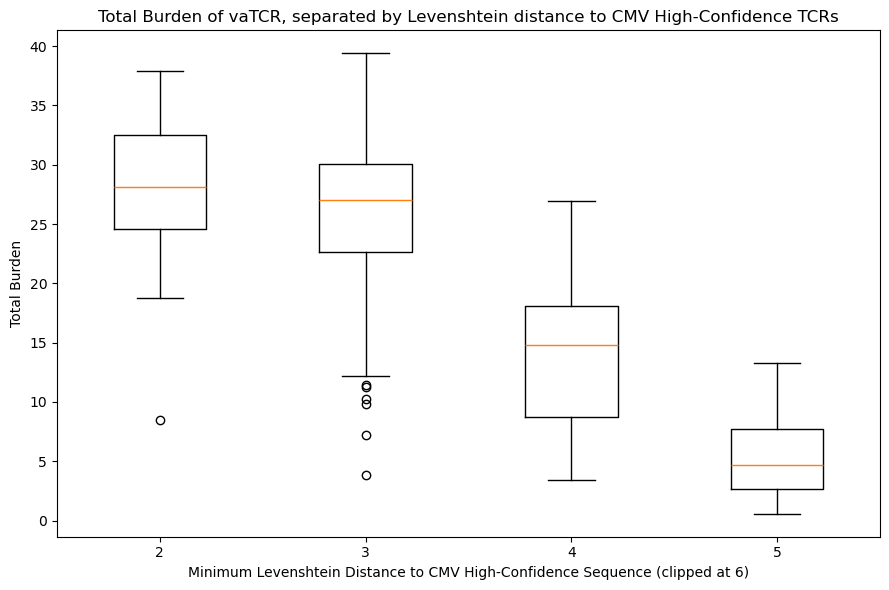

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# ─────────────── LOAD ANNOTATED DATA ───────────────
input_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/crossreactors/vatcr_cmv_crossreact.csv'
df = pd.read_csv(input_file)

# ─────────────── GROUP BURDENS BY LEVENSHTEIN DISTANCE ───────────────
# Clip distances at 6 to avoid outliers distorting the axis
df['clipped_dist'] = df['min_leven_dist'].clip(upper=6)
grouped = [df[df['clipped_dist'] == d]['Total_Burden'] for d in sorted(df['clipped_dist'].unique())]

# ─────────────── PLOT ───────────────
plt.figure(figsize=(9, 6))
plt.boxplot(grouped, labels=sorted(df['clipped_dist'].unique()))
plt.xlabel('Minimum Levenshtein Distance to CMV High-Confidence Sequence (clipped at 6)')
plt.ylabel('Total Burden')
plt.title('Total Burden of vaTCR, separated by Levenshtein distance to CMV High-Confidence TCRs')
plt.tight_layout()
# remove gridlines
plt.grid(False)
plt.show()


In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# ─────────────── LOAD DATA ───────────────
input_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/cmv_idh_crossreactors/idh_cmv_crossreact.csv'
df = pd.read_csv(input_file)

# ─────────────── SCATTER PLOT ───────────────
plt.figure(figsize=(8, 6))
plt.scatter(df['min_leven_dist'], df['Total_Burden'], alpha=0.6, s=20)
plt.xlabel('Minimum Levenshtein Distance to CMV High-Confidence Sequence')
plt.ylabel('Total Burden')
plt.title('Sequence Closeness vs Total Burden')
plt.grid(True)
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/Users/ishaharris/Projects/TCR/TCR-Isha/data/cmv_idh_crossreactors/idh_cmv_crossreact.csv'

Now we can remove the CMV cross reactors (within Leven 4?) And see if IDH still correlates with CMV status.

Do the most expanded clones have high pGEN?

In [18]:
import pandas as pd

# Load files
pgen_df = pd.read_csv('/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen/all_invitro_pgen.tsv', sep='\t')
burden_df = pd.read_csv('/Users/ishaharris/Projects/TCR/TCR-Isha/data/crossreactors/idh_totalburden.csv')

# Inspect columns to determine merge key
print("Pgen columns:", pgen_df.columns.tolist())
print("Burden columns:", burden_df.columns.tolist())

# Assuming the shared key column is named 'amino_acid' or similar in both files
common_keys = set(pgen_df.columns).intersection(set(burden_df.columns))
print("Common columns:", common_keys)

# Example: if the common column is 'amino_acid'
merged_df = pd.merge(pgen_df, burden_df, on='Sequence', how='inner')

# Show the merged result
print(merged_df.head())

# scatter plot of pgen v total burden
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 6))
plt.scatter(merged_df['Pgen'], merged_df['Total_Burden'], alpha=0.6, s=20)
plt.xlabel('Pgen')
# log x axis
plt.xscale('log')
plt.ylabel('Total Burden')
plt.title('Pgen vs Total Burden of Random VDJdb Sequences')
plt.grid(True)
plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen/all_invitro_pgen.tsv'

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_21835/1224985302.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=metrics_df, x='CMV_label', y='mean_log_pgen', ax=axes[0], palette='pastel')
/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_21835/1224985302.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=metrics_df, x='CMV_label', y='frac_high_pgen', ax=axes[1], palette='pastel')
/Users/ishaharris/Projects/TCR/TCR-Isha/tcr_env/lib/python3.11/site-packages/seaborn/utils.py:61: UserWarning: Glyph 8321 (\N{SUBSCRIPT ONE}) missing from font(s) Arial.
  fig.canvas.draw()
/Users/ishaharris/Projects/TCR/TCR-Isha/tcr_env/lib/python3.11/site-packages/seaborn/ut

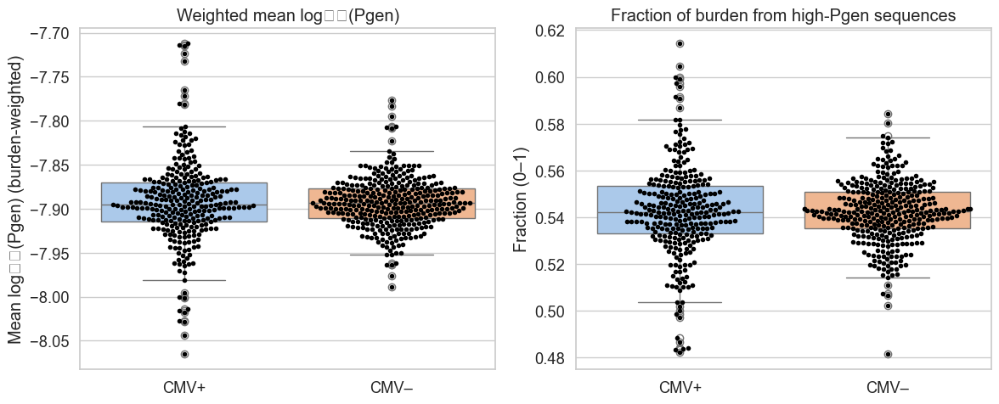

### Heatmap with CMV cross reactors removed

In [37]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob
from rapidfuzz.distance import Levenshtein as L

# ─────────────── CONFIGURATION ───────────────
matrix_dist_cutoff     = 4   # used to choose which matrix to load
cmv_filter_dist_cutoff = 4   # used to filter out sequences too close to CMV

focus_alleles = ['A*02']
root_dir = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/vatcr_emerson'
matrix_file = os.path.join(root_dir, f'all_dist_{matrix_dist_cutoff}_matrix.csv')
metadata_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'
highconf_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/High_Confidence_CMV_TCR/WITHOUT_EBV_highconf.tsv'
pgen_dir = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
pgen_file = 'all_invitro_pgen.tsv'

# ─────────────── LOAD METADATA & BURDEN MATRIX ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")
filtered = metadata[
    metadata['sample_name'].str.startswith('P') &
    metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
]

# CMV & HLA map
cmv_map = {}
hla_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tag = row['sample_tags']
    cmv_map[pid] = 1 if 'Cytomegalovirus +' in tag else 0
    hla_map[pid] = int(any(f'HLA-{allele}' in tag for allele in focus_alleles))

df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df[[pid for pid in df.columns if pid in cmv_map]]
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

# ─────────────── LOAD HIGHCONF SEQUENCES ───────────────
highconf = pd.read_csv(highconf_file, sep='\t')['amino_acid'].dropna().unique().tolist()

# ─────────────── FILTER OUT CROSS-REACTIVE SEQUENCES ───────────────
def min_leven_dist(seq, refs, stop=cmv_filter_dist_cutoff):
    best = stop + 1
    for r in refs:
        d = L.distance(seq, r)
        if d < best:
            best = d
            if best == 0:
                break
    return best

distances = {seq: min_leven_dist(seq, highconf, stop=cmv_filter_dist_cutoff) for seq in df.index}
keep_seqs = [seq for seq, d in distances.items() if d > cmv_filter_dist_cutoff]
df = df.loc[keep_seqs]

# ─────────────── ORDER COLUMNS ───────────────
total_burden = df.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()
focus_pos = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 1 and cmv_map[pid] == 1]
focus_neg = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 1 and cmv_map[pid] == 0]
other_pos = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 0 and cmv_map[pid] == 1]
other_neg = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 0 and cmv_map[pid] == 0]
ordered_cols = focus_pos + focus_neg + other_pos + other_neg
df = df[ordered_cols]

# ─────────────── ANNOTATION STRIPS ───────────────
status_strip = [cmv_map[pid] for pid in ordered_cols]
hla_strip = [hla_map.get(pid, 0) for pid in ordered_cols]

# ─────────────── MERGE PGEN VALUES ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, pgen_file)):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())
pgen_array = [pgen_map.get(seq, np.nan) for seq in df.index]

# ─────────────── CLUSTER SEQUENCES ───────────────
dist_rows = pdist(df.values, metric='euclidean')
Z_rows = linkage(dist_rows, method='average')
leaf_order = dendrogram(Z_rows, no_plot=True)['leaves']
df = df.iloc[leaf_order, :]
pgen_array = [pgen_array[i] for i in leaf_order]

# ─────────────── PLOTTING ───────────────
fig = plt.figure(figsize=(18,11))
gs = fig.add_gridspec(3, 3, height_ratios=[20,1,1], width_ratios=[20,1,1], hspace=0.02, wspace=0.05)

ax_heat = fig.add_subplot(gs[0,0])
ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
ax_cbar = fig.add_subplot(gs[0,2])
ax_cmv = fig.add_subplot(gs[1,0], sharex=ax_heat)
ax_hla = fig.add_subplot(gs[2,0], sharex=ax_heat)

# Heatmap
imshow_kwargs = dict(aspect='auto', cmap='viridis')
if df.values.size:
    imshow_kwargs.update(vmin=df.values.min(), vmax=df.values.max())
im = ax_heat.imshow(df.values, **imshow_kwargs)
fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (matrix dist ≤ {matrix_dist_cutoff})')
ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
ax_heat.set_title(f'IDH sequences after removing CMV cross-reactors (Levenshtein > {cmv_filter_dist_cutoff})')
ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

# Pgen bar
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

# CMV strip
cmap_cmv = ListedColormap(['blue', 'red'])
ax_cmv.imshow(np.array(status_strip)[None, :], aspect='auto',
              cmap=cmap_cmv, vmin=0, vmax=1)
ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False); ax_cmv.set_xticks([])

# HLA strip
cmap_hla = ListedColormap(['lightgrey', 'darkgreen'])
ax_hla.imshow(np.array(hla_strip)[None, :], aspect='auto',
              cmap=cmap_hla, vmin=0, vmax=1)
ax_hla.set_yticks([]); ax_hla.set_frame_on(False); ax_hla.set_xticks([])

# Dividers
cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
for c in cuts[:-1]:
    for ax in (ax_heat, ax_cmv, ax_hla):
        ax.axvline(c - 0.5, color='white', lw=1.5)

# Legend
leg_cmv = [mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
           mpatches.Patch(color=cmap_cmv(1), label='CMV+')]
leg_hla = [mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
           mpatches.Patch(color=cmap_hla(1), label='Focus HLA')]
fig.legend(handles=leg_cmv + leg_hla,
           loc='center left', bbox_to_anchor=(0.98, 0.2))

fig.subplots_adjust(top=0.9, bottom=0.2, right=0.9)
focus_hla_text = "Focus HLAs:\n" + "\n".join(focus_alleles)
fig.text(0.995, 0.35, focus_hla_text,
         fontsize=8, va='top', ha='left',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

plt.show()


ValueError: Data has no positive values, and therefore cannot be log-scaled.

<Figure size 1800x1100 with 5 Axes>

Summary stats

In [38]:
import pandas as pd

# 1) Compute total burden per patient (from your filtered df)
total_burden = df.sum(axis=0)

# 2) Build a summary DataFrame
summary = pd.DataFrame({
    'patient_id':    total_burden.index,
    'total_burden':  total_burden.values,
})

# annotate CMV and HLA status
summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'pos' if cmv_map[pid]==1 else 'neg')
summary['hla_group']  = summary['patient_id'].map(lambda pid: 'focus' if hla_map.get(pid,0)==1 else 'other')

# define the 4-level group
summary['group'] = summary['hla_group'].str.capitalize() + ' / CMV ' + summary['cmv_status'].str.upper()

# 3) Compute summary stats
stats = summary.groupby('group')['total_burden'].agg(
    count='count',
    mean='mean',
    median='median',
    std='std',
    min='min',
    max='max'
).reset_index()

print(stats)


             group  count      mean    median       std       min       max
0  Focus / CMV NEG    156  0.168943  0.165605  0.045624  0.096712  0.623316
1  Focus / CMV POS    136  0.166689  0.162664  0.040907  0.091310  0.343655
2  Other / CMV NEG    195  0.168267  0.166581  0.034415  0.094141  0.406670
3  Other / CMV POS    153  0.163440  0.156149  0.042073  0.084396  0.424818


### Heatmap with donor of origin marking

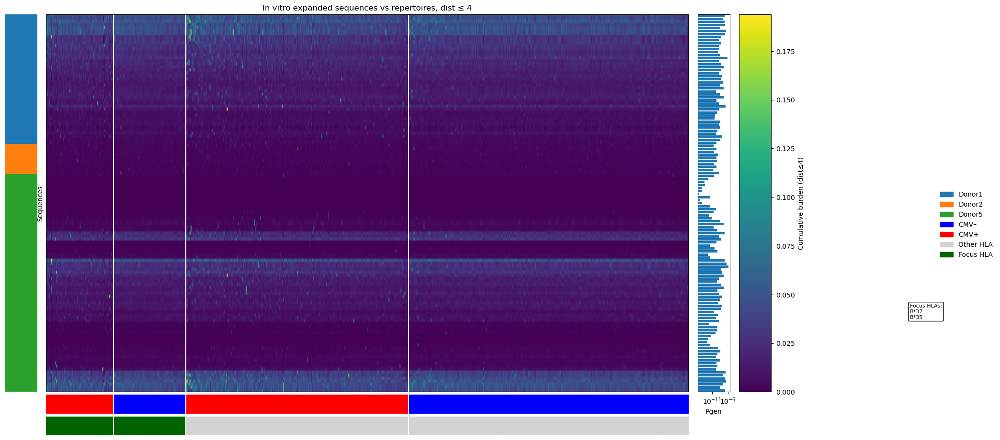

In [44]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob

# ─────────────── CONFIGURATION ───────────────
max_dist       = 4
root_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/idh/all'
matrix_file    = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── LOAD METADATA & FILTER VALID PATIENTS ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")

filtered = metadata[
    metadata['sample_name'].str.startswith('P') &
    metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
]

if filtered.empty:
    raise ValueError("No metadata rows match your CMV/sample_name filters.")

cmv_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tag = row['sample_tags']
    cmv_map[pid] = 1 if 'Cytomegalovirus +' in tag else 0

focus_alleles = ['B*37', 'B*35']
hla_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tags = row['sample_tags']
    hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))

# ─────────────── LOAD BURDEN MATRIX & FILTER ───────────────
df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)
df = df[[pid for pid in df.columns if pid in cmv_map]]
if df.shape[1] == 0:
    raise ValueError("No patients left after filtering by metadata.")

# ─────────────── ORDER COLUMNS ───────────────
total_burden = df.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()

focus_pos = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 1 and cmv_map[pid] == 1]
focus_neg = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 1 and cmv_map[pid] == 0]
other_pos = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 0 and cmv_map[pid] == 1]
other_neg = [pid for pid in burden_sorted if hla_map.get(pid, 0) == 0 and cmv_map[pid] == 0]

ordered_cols = focus_pos + focus_neg + other_pos + other_neg
df = df[ordered_cols]

status_strip = [cmv_map[pid] for pid in ordered_cols]
hla_strip = [hla_map.get(pid, 0) for pid in ordered_cols]

# ─────────────── LOAD PGEN ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, 'all_invitro_pgen.tsv')):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())

# ─────────────── LOAD DONOR DATA ───────────────
donor_dfs = {
    'Donor1': pd.read_csv('/Users/ishaharris/Projects/TCR/TCR-Isha/data/IDH_Heatmaps/highconf/donor1_IDH_highconf.tsv', sep='\t')['amino_acid'].tolist(),
    'Donor2': pd.read_csv('/Users/ishaharris/Projects/TCR/TCR-Isha/data/IDH_Heatmaps/highconf/donor2_IDH_highconf.tsv', sep='\t')['amino_acid'].tolist(),
    'Donor5': pd.read_csv('/Users/ishaharris/Projects/TCR/TCR-Isha/data/IDH_Heatmaps/highconf/donor5_IDH_highconf.tsv', sep='\t')['amino_acid'].tolist(),
}

seq2donor = {}
for donor, seqs in donor_dfs.items():
    for s in seqs:
        seq2donor[s] = donor

missing = set(df.index) - set(seq2donor)
if missing:
    raise KeyError(f"Some sequences not found in any donor list: {missing}")

donor_order = ['Donor1', 'Donor2', 'Donor5']
donor_label = {d: i for i, d in enumerate(donor_order)}

# ─────────────── CLUSTER WITHIN DONOR GROUPS ───────────────
new_leaves = []
for d in donor_order:
    idxs = [i for i, s in enumerate(df.index) if seq2donor[s] == d]
    if len(idxs) > 1:
        submat = df.values[idxs, :]
        Z = linkage(pdist(submat, metric='euclidean'), method='average')
        order = dendrogram(Z, no_plot=True)['leaves']
        ordered = [idxs[i] for i in order]
    else:
        ordered = idxs
    new_leaves.extend(ordered)

df = df.iloc[new_leaves, :]
pgen_array = [pgen_map.get(seq, np.nan) for seq in df.index]
donor_strip = np.array([donor_label[seq2donor[seq]] for seq in df.index])

# ─────────────── PLOTTING ───────────────
fig = plt.figure(figsize=(20, 11))
gs = fig.add_gridspec(
    3, 4,
    height_ratios=[20, 1, 1],
    width_ratios=[1, 20, 1, 1],
    hspace=0.02, wspace=0.05
)

cmap_donor = ListedColormap(['#1f77b4', '#ff7f0e', '#2ca02c'])  # blue, orange, green
ax_donor = fig.add_subplot(gs[0, 0])
ax_donor.imshow(donor_strip[:, None], aspect='auto',
                cmap=cmap_donor, vmin=0, vmax=2)
ax_donor.set_xticks([]); ax_donor.set_yticks([]); ax_donor.set_frame_on(False)

ax_heat = fig.add_subplot(gs[0, 1])
imshow_kwargs = dict(aspect='auto', cmap='viridis',
                     vmin=df.values.min(), vmax=df.values.max())
im = ax_heat.imshow(df.values, **imshow_kwargs)
ax_heat.set_yticks([])
ax_heat.set_ylabel('Sequences')
ax_heat.set_xticks([])
ax_heat.set_title(f'In vitro expanded sequences vs repertoires, dist ≤ {max_dist}')
ax_heat.tick_params(axis='x', which='both', length=0)

ax_pgen = fig.add_subplot(gs[0, 2], sharey=ax_heat)
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen')
ax_pgen.set_xscale('log')
ax_pgen.set_yticks([])

ax_cbar = fig.add_subplot(gs[0, 3])
fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')

ax_cmv = fig.add_subplot(gs[1, 1], sharex=ax_heat)
ax_hla = fig.add_subplot(gs[2, 1], sharex=ax_heat)
cmap_cmv = ListedColormap(['blue', 'red'])
cmap_hla = ListedColormap(['lightgrey', 'darkgreen'])

ax_cmv.imshow(np.array(status_strip)[None, :], aspect='auto',
              cmap=cmap_cmv, vmin=0, vmax=1)
ax_cmv.set_yticks([])
ax_cmv.set_frame_on(False)
ax_cmv.set_xticks([])

ax_hla.imshow(np.array(hla_strip)[None, :], aspect='auto',
              cmap=cmap_hla, vmin=0, vmax=1)
ax_hla.set_yticks([])
ax_hla.set_frame_on(False)
ax_hla.set_xticks([])

cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
for c in cuts[:-1]:
    for ax in (ax_heat, ax_cmv, ax_hla):
        ax.axvline(c - 0.5, color='white', lw=1.5)

leg_donor = [
    mpatches.Patch(color=cmap_donor(i), label=d)
    for i, d in enumerate(donor_order)
]
leg_cmv = [
    mpatches.Patch(color='blue', label='CMV–'),
    mpatches.Patch(color='red', label='CMV+')
]
leg_hla = [
    mpatches.Patch(color='lightgrey', label='Other HLA'),
    mpatches.Patch(color='darkgreen', label='Focus HLA')
]

fig.legend(handles=leg_donor + leg_cmv + leg_hla,
           loc='center left', bbox_to_anchor=(1.02, 0.5), frameon=False)

fig.subplots_adjust(top=0.9, bottom=0.1, left=0.05, right=0.85)

# Focus HLA note
focus_hla_text = "Focus HLAs:\n" + "\n".join(focus_alleles)
fig.text(0.995, 0.35, focus_hla_text,
         fontsize=8, va='top', ha='left',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

plt.show()


Summary stats

In [45]:
# 1) Unpivot and label axes
long_df = (
    df
    .stack()
    .rename("burden")
    .rename_axis(index=["sequence", "patient"])
    .reset_index()
)

# 2) Map donor and HLA group
long_df["donor"]     = long_df["sequence"].map(seq2donor)
long_df["hla_focus"] = long_df["patient"].map(hla_map)
long_df["hla_group"] = long_df["hla_focus"].map({1: "focus", 0: "other"})

# 3) Group by donor and HLA group only
stats = (
    long_df
    .groupby(["donor", "hla_group"])["burden"]
    .agg(["mean", "median", "std", "min", "max"])
    .reset_index()
    .sort_values(["donor", "hla_group"])
)

# 4) Pretty-print with 6 decimal places
for _, r in stats.iterrows():
    print(
        f"Donor: {r.donor:7} | "
        f"HLA: {r.hla_group:5} | "
        f"mean={r['mean']:.6f}, median={r['median']:.6f}, "
        f"std={r['std']:.6f}, min={r['min']:.6f}, max={r['max']:.6f}"
    )


Donor: Donor1  | HLA: focus | mean=0.014915, median=0.009752, std=0.015920, min=0.000000, max=0.169456
Donor: Donor1  | HLA: other | mean=0.015000, median=0.009847, std=0.015961, min=0.000000, max=0.193848
Donor: Donor2  | HLA: focus | mean=0.013813, median=0.003169, std=0.017380, min=0.000369, max=0.191358
Donor: Donor2  | HLA: other | mean=0.013940, median=0.003218, std=0.017029, min=0.000000, max=0.139523
Donor: Donor5  | HLA: focus | mean=0.013026, median=0.007062, std=0.014984, min=0.000000, max=0.178718
Donor: Donor5  | HLA: other | mean=0.013056, median=0.007130, std=0.015119, min=0.000000, max=0.187404


### Normalised score
- I have to artificially cap the scores because a few very positive outliers are skewing the saturation

Deciding on the cap:

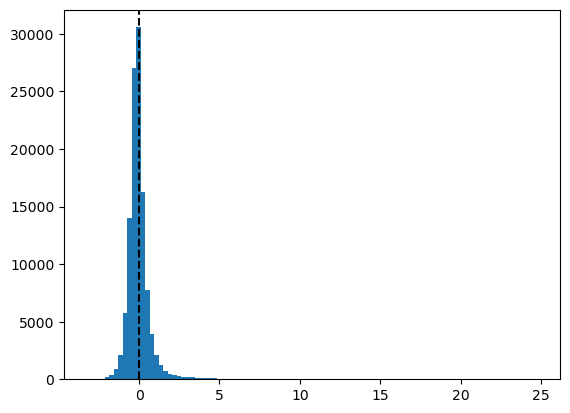

3.437428991404482


In [53]:
# Visualise distribution
plt.hist(df_norm.values.flatten(), bins=100)
plt.axvline(x=0, color='black', linestyle='--')
plt.show()

# Data driven cap setting 

vals = df_norm.values.flatten()
cap_suggestion = np.percentile(np.abs(vals), 99)  # e.g., clip only top 1% of values
print(cap_suggestion)



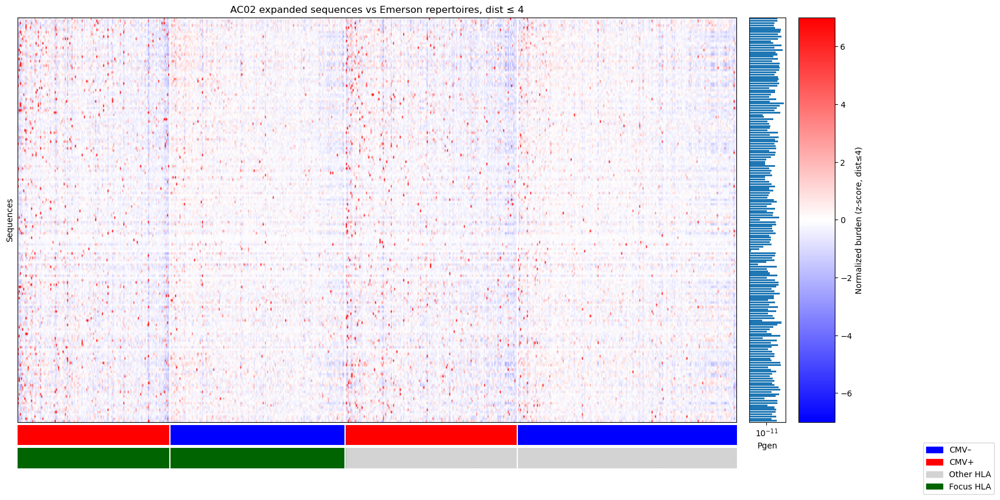

In [59]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, TwoSlopeNorm
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob

# ─────────────── CONFIGURATION ───────────────
max_dist       = 4
cap            = 7
root_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/cmv/all'
matrix_file    = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
pgen_file      = 'WITHOUTEBV_pgen_output.tsv'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── LOAD METADATA & FILTER VALID PATIENTS ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")

filtered = metadata[
     metadata['sample_name'].str.startswith('P') &
     metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
]

if filtered.empty:
    raise ValueError("No metadata rows match your CMV/sample_name filters.")

# Build CMV map
cmv_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tag = row['sample_tags']
    cmv_map[pid] = 1 if 'Cytomegalovirus +' in tag else 0

# Build HLA focus map
focus_alleles = ['A*02']
hla_map = {}
for _, row in filtered.iterrows():
    pid = row['sample_name'] + '.tsv'
    tags = row['sample_tags']
    hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))

# ─────────────── LOAD BURDEN MATRIX & FILTER TO VALID PATIENTS ───────────────
df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

df = df[[pid for pid in df.columns if pid in cmv_map]]
if df.shape[1] == 0:
    raise ValueError("No patients left after filtering by metadata.")

# ─────────────── NORMALIZE ACROSS ROWS ───────────────
df_norm = (
    df
    .sub(df.mean(axis=1), axis=0)
    .div(df.std(axis=1), axis=0)
    .fillna(0.0)
)

# ─────────────── ORDER COLUMNS BY NORMALIZED BURDEN ───────────────
total_burden = df_norm.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()

focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==1]
focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==0]
other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==1]
other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==0]

ordered_cols = focus_pos + focus_neg + other_pos + other_neg
df_norm = df_norm[ordered_cols]

# Build annotation strips
status_strip = [cmv_map[pid] for pid in ordered_cols]
hla_strip    = [hla_map.get(pid,0) for pid in ordered_cols]

# ─────────────── MERGE PGEN VALUES ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, pgen_file)):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())

# ─────────────── ORDER SEQUENCES BY TOTAL BURDEN ───────────────
row_totals = df_norm.sum(axis=1)  # sum across patients for each sequence
df_norm = df_norm.loc[row_totals.sort_values(ascending=False).index]

# Keep Pgen array in new order
pgen_array = [pgen_map.get(seq, np.nan) for seq in df_norm.index]


# ─────────────── PLOTTING ───────────────
fig = plt.figure(figsize=(18,11))
gs  = fig.add_gridspec(3,3,
    height_ratios=[20,1,1],
    width_ratios =[20,1,1],
    hspace=0.02, wspace=0.05)

ax_heat = fig.add_subplot(gs[0,0])
ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
ax_cbar = fig.add_subplot(gs[0,2])
ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

# ─────── Heatmap with z-score clipping ───────

df_display = df_norm.clip(-cap, cap)
norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)

im = ax_heat.imshow(df_display.values, aspect='auto', cmap='bwr', norm=norm)
fig.colorbar(im, cax=ax_cbar, label=f'Normalized burden (z-score, dist≤{max_dist})')
ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
ax_heat.set_title(f'AC02 expanded sequences vs Emerson repertoires, dist ≤ {max_dist}')
ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

# Pgen bar
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

# CMV strip
cmap_cmv = ListedColormap(['blue','red'])
ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto',
              cmap=cmap_cmv, vmin=0, vmax=1)
ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False); ax_cmv.set_xticks([])

# HLA strip
cmap_hla = ListedColormap(['lightgrey','darkgreen'])
ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto',
              cmap=cmap_hla, vmin=0, vmax=1)
ax_hla.set_yticks([]); ax_hla.set_frame_on(False); ax_hla.set_xticks([])

# Dividers
cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
for c in cuts[:-1]:
    for ax in (ax_heat, ax_cmv, ax_hla):
        ax.axvline(c-0.5, color='white', lw=1.5)

# Legend
leg_cmv = [
    mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
    mpatches.Patch(color=cmap_cmv(1), label='CMV+')
]
leg_hla = [
    mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
    mpatches.Patch(color=cmap_hla(1), label='Focus HLA')
]
fig.legend(handles=leg_cmv + leg_hla,
           loc='center left', bbox_to_anchor=(0.98,0.2))

fig.subplots_adjust(top=0.9, bottom=0.2, right=0.9)
plt.show()


Summary data

In [32]:
import pandas as pd

# Load and transpose
df = pd.read_csv(matrix_file, index_col='patient_id').T

# Compute mean normalized burden
mean_score = df_norm.mean(axis=0)

# Create summary dataframe
summary = pd.DataFrame({
    'patient_id': mean_score.index,
    'mean_score': mean_score.values,
})

# Annotate CMV and HLA status
summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'POS' if cmv_map[pid] == 1 else 'NEG')
summary['hla_group']  = summary['patient_id'].map(lambda pid: 'Focus' if hla_map.get(pid, 0) == 1 else 'Other')

# Define the combined group
summary['group'] = summary['hla_group'] + ' / CMV ' + summary['cmv_status']

# Compute grouped statistics
stats = summary.groupby('group')['mean_score'].agg(
    count='count',
    mean='mean',
    median='median',
    std='std',
    min='min',
    max='max'
).round(3).reset_index()

# Print the result

print(stats)


             group  count   mean  median    std    min    max
0  Focus / CMV NEG    156  0.013   0.004  0.116 -0.492  0.315
1  Focus / CMV POS    136  0.017   0.023  0.154 -0.576  0.466
2  Other / CMV NEG    195 -0.007  -0.001  0.112 -0.379  0.373
3  Other / CMV POS    153 -0.020  -0.011  0.181 -1.026  0.677


Box plots

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_21835/227540092.py:27: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=group_order, notch=False)


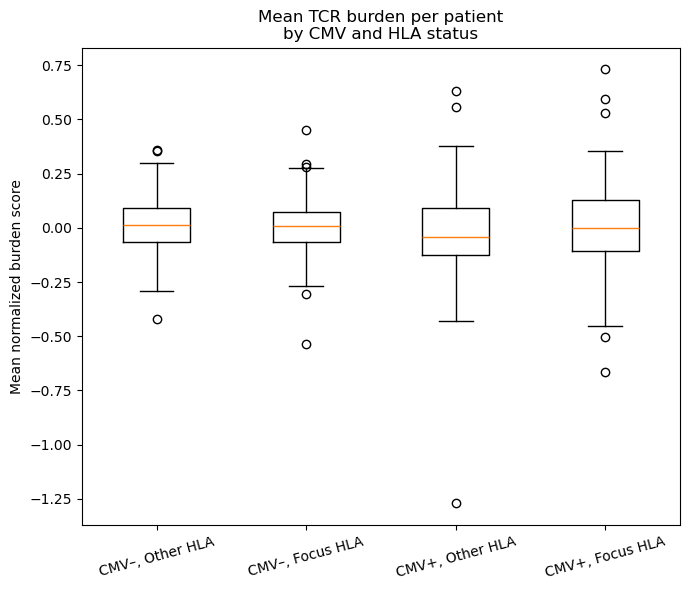

In [59]:
import matplotlib.pyplot as plt
import pandas as pd

# Compute each patient’s mean normalized burden
mean_score = df_norm.mean(axis=0)

# Build a DataFrame for plotting
bp_df = pd.DataFrame({
    'patient_id': mean_score.index,
    'mean_score': mean_score.values,
    'CMV_status': ['CMV+' if cmv_map[pid] == 1 else 'CMV–' for pid in mean_score.index],
    'HLA_focus': ['Focus HLA' if hla_map.get(pid, 0) == 1 else 'Other HLA' for pid in mean_score.index]
})
bp_df['Group'] = bp_df['CMV_status'] + ', ' + bp_df['HLA_focus']

# Prepare box plot data
group_order = [
    'CMV–, Other HLA',
    'CMV–, Focus HLA',
    'CMV+, Other HLA',
    'CMV+, Focus HLA'
]
data = [bp_df.loc[bp_df['Group'] == group, 'mean_score'] for group in group_order]

# Plot
fig, ax = plt.subplots(figsize=(7,6))
ax.boxplot(data, labels=group_order, notch=False)
ax.set_ylabel('Mean normalized burden score')
ax.set_title('Mean TCR burden per patient\nby CMV and HLA status')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()


### Loop through each 4 highconf and output a normalised heatmap, and summary stats
- Just like the previous loop, but with normalised data


=== INVITRO ===


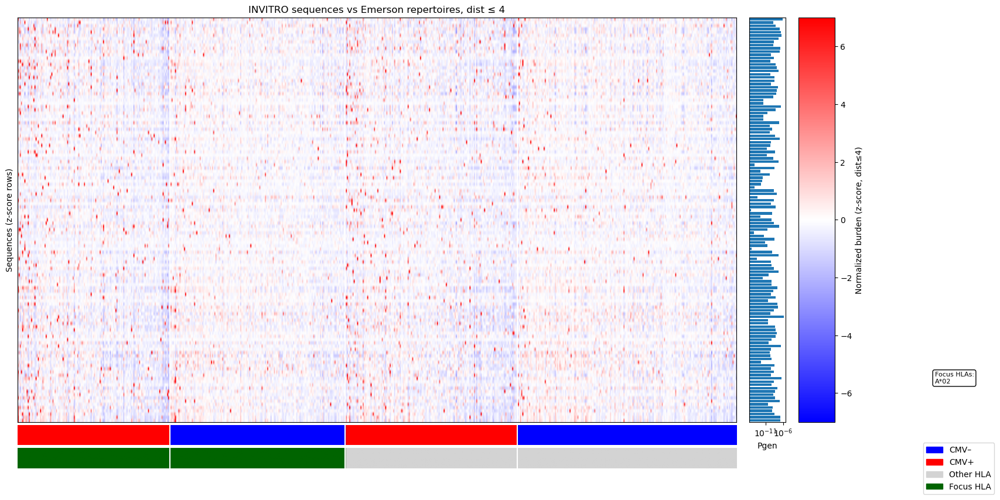

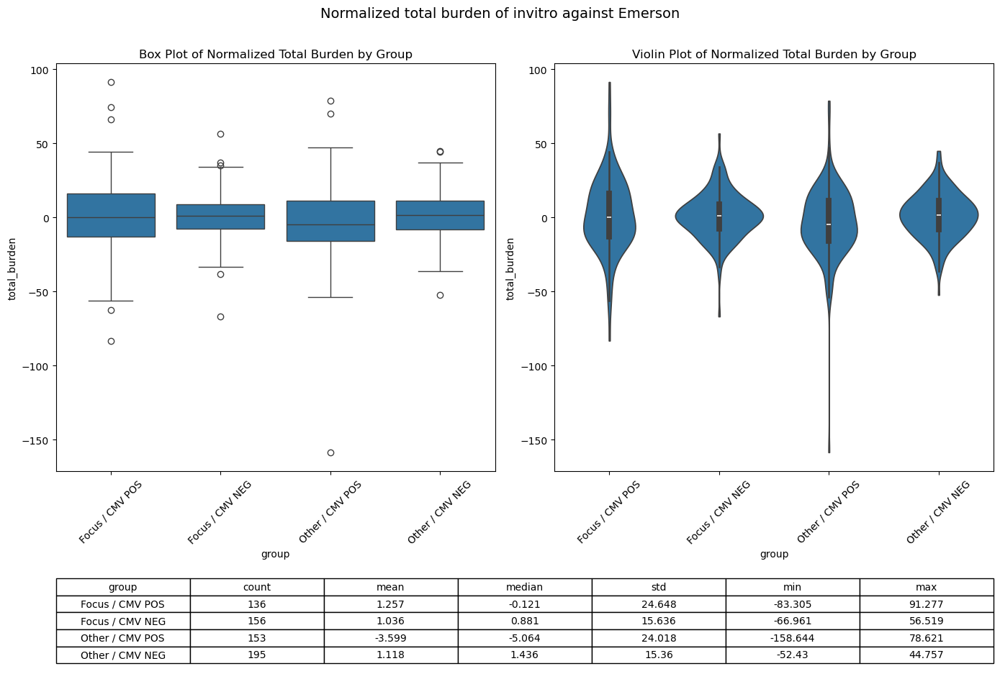


=== VATCR ===


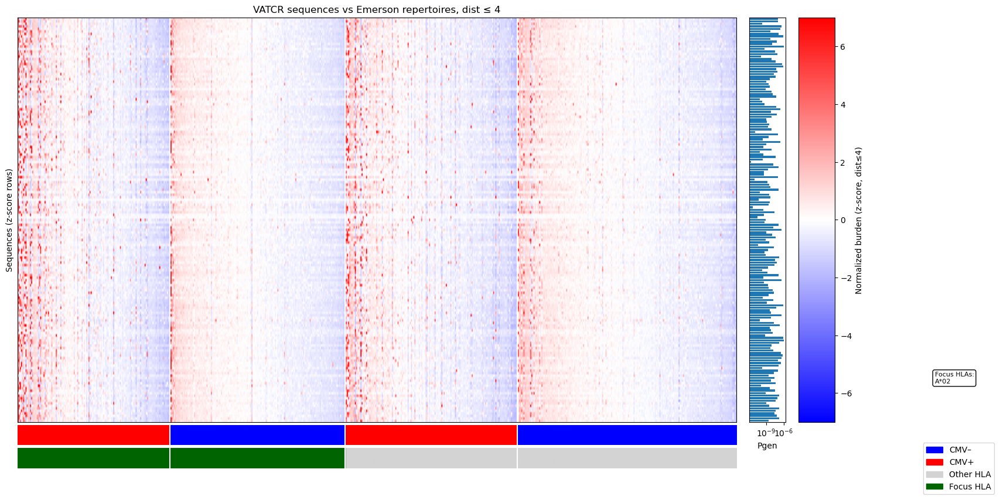

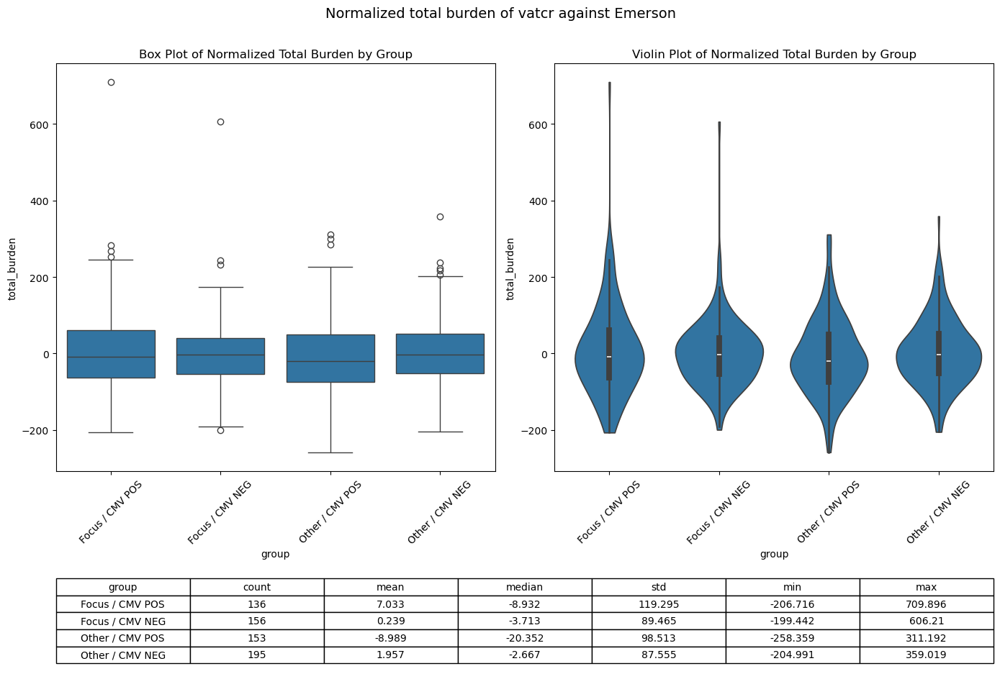


=== AC02 ===


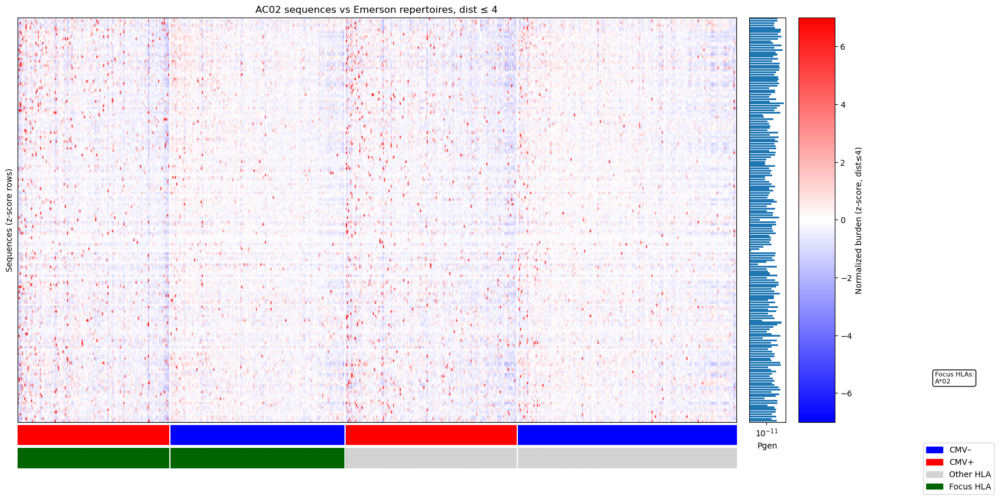

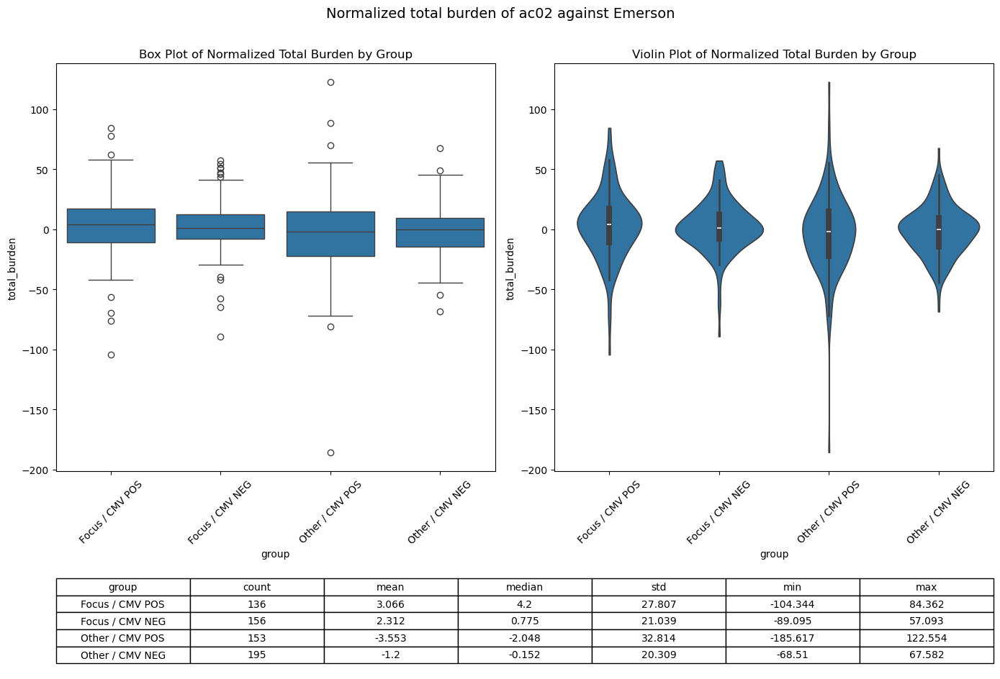


=== RANDOM100 ===


ValueError: Data has no positive values, and therefore cannot be log-scaled.

<Figure size 1800x1100 with 5 Axes>

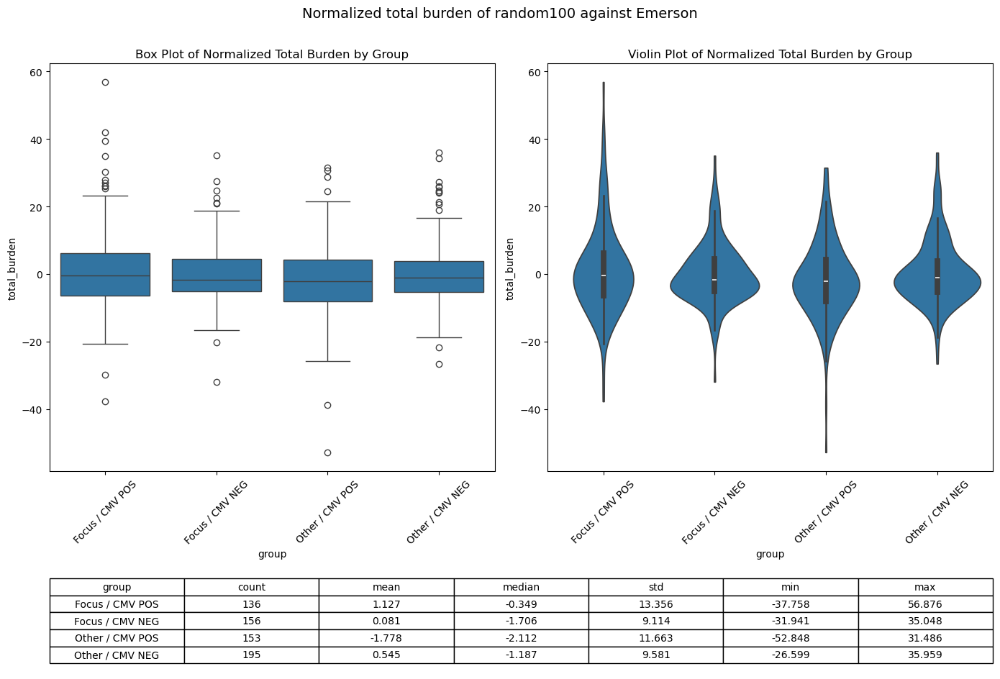


=== OLGA_RANDOM ===


FileNotFoundError: [Errno 2] No such file or directory: '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/olga_random_emerson/all_dist_4_matrix.csv'

In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, TwoSlopeNorm
from glob import glob
import seaborn as sns
from matplotlib import gridspec

# ─────────────── CONFIG ───────────────
max_dist       = 4
cap            = 7                          # z-score clipping limit (±cap)
focus_alleles  = ['A*02']                   # set as needed (empty list => no focus)
highconf_list  = ['invitro', 'vatcr', 'ac02', 'random100', 'olga_random']

base_heat_dir  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output'
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── HELPERS ───────────────
def build_maps(metadata_path, focus_alleles):
    metadata = pd.read_csv(metadata_path, sep="\t")
    filtered = metadata[
        metadata['sample_name'].str.startswith('P') &
        metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
    ]
    if filtered.empty:
        raise ValueError("No metadata rows match CMV/sample_name filters.")

    cmv_map, hla_map = {}, {}
    for _, row in filtered.iterrows():
        pid  = row['sample_name'] + '.tsv'
        tags = row['sample_tags']
        if 'Cytomegalovirus +' in tags:
            cmv_map[pid] = 1
        elif 'Cytomegalovirus -' in tags:
            cmv_map[pid] = 0
        hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))
    return cmv_map, hla_map

def load_burden_matrix(root_dir, max_dist):
    matrix_file = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
    df = pd.read_csv(matrix_file, index_col='patient_id').T
    return df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

def normalize_rows_z(df):
    """Row-wise z-score normalization; NaNs→0 if std=0."""
    return df.sub(df.mean(axis=1), axis=0).div(df.std(axis=1), axis=0).fillna(0.0)

def load_pgen_map(pgen_dir, highconf):
    """Assumes files like pgen_dir/all_{highconf}.tsv with columns [Sequence, Pgen]."""
    pgen_file = os.path.join(pgen_dir, f'all_{highconf}.tsv')
    if not os.path.exists(pgen_file):
        matches = glob(os.path.join(pgen_dir, f'*{highconf}*.tsv'))
        if not matches:
            return {}
        pgen_file = matches[0]
    sub_df = pd.read_csv(pgen_file, sep='\t').set_index('Sequence')
    return sub_df['Pgen'].to_dict()

def order_columns(df_norm, cmv_map, hla_map):
    """Order columns using TOTAL of normalized burden (desc), grouped by (focus, CMV)."""
    total_burden = df_norm.sum(axis=0)
    burden_sorted = total_burden.sort_values(ascending=False).index.tolist()
    focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==1]
    focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map[pid]==0]
    other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==1]
    other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map[pid]==0]
    ordered_cols = focus_pos + focus_neg + other_pos + other_neg
    return ordered_cols, (focus_pos, focus_neg, other_pos, other_neg)

def plot_heatmap_z(df_norm, cmv_map, hla_map, pgen_map, max_dist, highconf, focus_alleles, ordered_blocks, cap):
    ordered_cols = df_norm.columns.tolist()
    status_strip = [cmv_map[c] for c in ordered_cols]
    hla_strip    = [hla_map.get(c,0) for c in ordered_cols]

    # Order rows by TOTAL normalized burden (desc)
    row_totals = df_norm.sum(axis=1)
    row_order  = row_totals.sort_values(ascending=False).index
    df_plot    = df_norm.loc[row_order]

    pgen_array = [pgen_map.get(seq, np.nan) for seq in df_plot.index]

    df_display = df_plot.clip(-cap, cap)
    norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)

    fig = plt.figure(figsize=(18,11))
    gs  = fig.add_gridspec(3,3, height_ratios=[20,1,1], width_ratios =[20,1,1], hspace=0.02, wspace=0.05)
    ax_heat = fig.add_subplot(gs[0,0])
    ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
    ax_cbar = fig.add_subplot(gs[0,2])
    ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
    ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

    im = ax_heat.imshow(df_display.values, aspect='auto', cmap='bwr', norm=norm)
    fig.colorbar(im, cax=ax_cbar, label=f'Normalized burden (z-score, dist≤{max_dist})')
    ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences (z-score rows)')
    ax_heat.set_title(f'{highconf.upper()} sequences vs Emerson repertoires, dist ≤ {max_dist}')
    ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

    ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
    ax_pgen.invert_yaxis()
    ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

    cmap_cmv = ListedColormap(['blue','red'])
    ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto', cmap=cmap_cmv, vmin=0, vmax=1)
    ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False); ax_cmv.set_xticks([])

    cmap_hla = ListedColormap(['lightgrey','darkgreen'])
    ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto', cmap=cmap_hla, vmin=0, vmax=1)
    ax_hla.set_yticks([]); ax_hla.set_frame_on(False); ax_hla.set_xticks([])

    focus_pos, focus_neg, other_pos, other_neg = ordered_blocks
    cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
    for c in cuts[:-1]:
        for ax in (ax_heat, ax_cmv, ax_hla):
            ax.axvline(c-0.5, color='white', lw=1.5)

    leg_cmv = [mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
               mpatches.Patch(color=cmap_cmv(1), label='CMV+')]
    leg_hla = [mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
               mpatches.Patch(color=cmap_hla(1), label='Focus HLA')]
    fig.legend(handles=leg_cmv + leg_hla, loc='center left', bbox_to_anchor=(0.98,0.2))

    if focus_alleles:
        fig.text(0.995, 0.35, "Focus HLAs:\n" + "\n".join(focus_alleles),
                 fontsize=8, va='top', ha='left',
                 bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

    fig.subplots_adjust(top=0.9, bottom=0.2, right=0.9)
    plt.show()

def plot_summary_panel(df_norm, cmv_map, hla_map, highconf):
    """
    Summary stats on NORMALIZED totals (row-wise z-scored data).
    """
    # *** use df_norm here, not df_raw ***
    total_burden = df_norm.sum(axis=0)

    summary = pd.DataFrame({
        'patient_id': total_burden.index,
        'total_burden': total_burden.values
    })
    summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'pos' if cmv_map[pid] == 1 else 'neg')
    summary['hla_group']  = summary['patient_id'].map(lambda pid: 'focus' if hla_map.get(pid, 0) == 1 else 'other')
    summary['group'] = summary['hla_group'].str.capitalize() + ' / CMV ' + summary['cmv_status'].str.upper()
    group_order = ['Focus / CMV POS', 'Focus / CMV NEG', 'Other / CMV POS', 'Other / CMV NEG']
    summary['group'] = pd.Categorical(summary['group'], categories=group_order, ordered=True)

    stats = summary.groupby('group', observed=True)['total_burden'].agg(
        count='count', mean='mean', median='median', std='std', min='min', max='max'
    ).reset_index()
    stats_display = stats.copy()
    if not stats_display.empty:
        stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    vals = summary['total_burden'].dropna().to_numpy()
    if vals.size:
        y_lo = vals.min() - 0.05*(vals.max()-vals.min())
        y_hi = vals.max() + 0.05*(vals.max()-vals.min())
    else:
        y_lo, y_hi = (0, 1)

    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])
    ax_box    = fig.add_subplot(gs[0, 0])
    ax_violin = fig.add_subplot(gs[0, 1], sharey=ax_box)
    ax_table  = fig.add_subplot(gs[1, :])

    sns.boxplot(data=summary, x='group', y='total_burden', order=group_order, ax=ax_box)
    ax_box.set_ylim(y_lo, y_hi)
    ax_box.set_title('Box Plot of Normalized Total Burden by Group')
    ax_box.tick_params(axis='x', rotation=45)

    sns.violinplot(data=summary, x='group', y='total_burden', order=group_order, cut=0, inner='box', ax=ax_violin)
    ax_violin.set_ylim(y_lo, y_hi)
    ax_violin.set_title('Violin Plot of Normalized Total Burden by Group')
    ax_violin.tick_params(axis='x', rotation=45)

    ax_table.axis('off')
    table = ax_table.table(
        cellText=stats_display.values if not stats_display.empty else [['']*len(['group','count','mean','median','std','min','max'])],
        colLabels=stats_display.columns if not stats_display.empty else ['group','count','mean','median','std','min','max'],
        cellLoc='center', loc='center'
    )
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.4)

    plt.suptitle(f'Normalized total burden of {highconf} against Emerson', fontsize=14, y=0.94)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

# ─────────────── MAIN LOOP ───────────────
cmv_map_all, hla_map_all = build_maps(metadata_file, focus_alleles)

for highconf in highconf_list:
    print(f"\n=== {highconf.upper()} ===")

    # Load RAW burden and filter to patients with CMV labels
    df_raw = load_burden_matrix(os.path.join(base_heat_dir, f'{highconf}_emerson'), max_dist)
    df_raw = df_raw[[pid for pid in df_raw.columns if pid in cmv_map_all]]
    if df_raw.shape[1] == 0:
        print("No patients left after filtering by metadata; skipping.")
        continue

    # Normalize rows (z-scores) for ordering/heatmap and summary stats
    df_norm = normalize_rows_z(df_raw)

    # Order columns by TOTAL normalized burden (desc) + group blocks
    ordered_cols, blocks = order_columns(df_norm, cmv_map_all, hla_map_all)
    df_norm = df_norm[ordered_cols]      # for heatmap/strips and summary panel

    # Load Pgen map aligned by sequence index
    pgen_map = load_pgen_map(pgen_dir, highconf)

    # Plot the normalized/centered heatmap with ±cap clipping
    plot_heatmap_z(df_norm, cmv_map_all, hla_map_all, pgen_map, max_dist, highconf, focus_alleles, blocks, cap)

    # *** Summary panel on NORMALIZED totals ***
    plot_summary_panel(df_norm, cmv_map_all, hla_map_all, highconf)


### Why on earth would the normalised scores be systematically lower for CMV-?

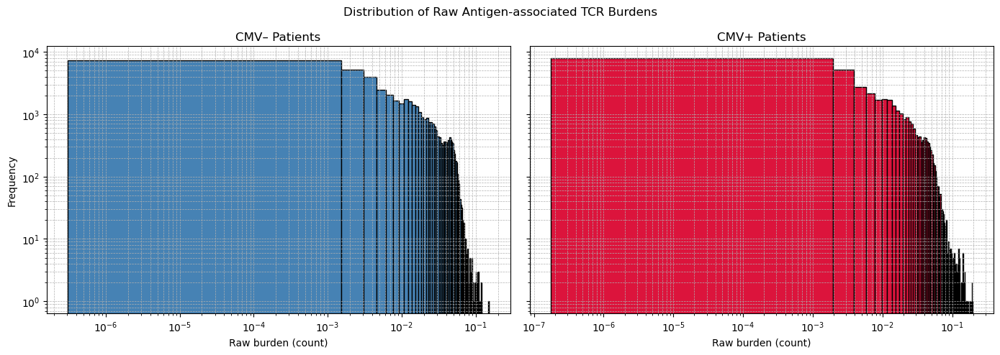

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---- Replace this with your actual data loading if needed ----
# Example:
# df = pd.read_csv(matrix_file, index_col='patient_id').T
# df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

# cmv_map = { 'collapsed_mair_CUH-014.tsv': 1, 'collapsed_mair_CUH-037.tsv': 0, ... }

# ---- Plotting raw count distributions ----
cmv_pos = [pid for pid in df.columns if cmv_map.get(pid) == 1]
cmv_neg = [pid for pid in df.columns if cmv_map.get(pid) == 0]

counts_pos = df[cmv_pos].values.flatten()
counts_neg = df[cmv_neg].values.flatten()

# Remove zeros for better log scaling
counts_pos = counts_pos[counts_pos > 0]
counts_neg = counts_neg[counts_neg > 0]

fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

axs[0].hist(counts_neg, bins=100, log=True, color='steelblue', edgecolor='black')
axs[0].set_title('CMV– Patients')
axs[0].set_xlabel('Raw burden (count)')
axs[0].set_ylabel('Frequency')
axs[0].set_xscale('log')
axs[0].grid(True, which='both', linestyle='--', linewidth=0.5)

axs[1].hist(counts_pos, bins=100, log=True, color='crimson', edgecolor='black')
axs[1].set_title('CMV+ Patients')
axs[1].set_xlabel('Raw burden (count)')
axs[1].set_xscale('log')
axs[1].grid(True, which='both', linestyle='--', linewidth=0.5)

fig.suptitle('Distribution of Raw Antigen-associated TCR Burdens')
plt.tight_layout()
plt.show()


# MAIR
### Modified above, draw a heatmap for the output from Mair repertoires

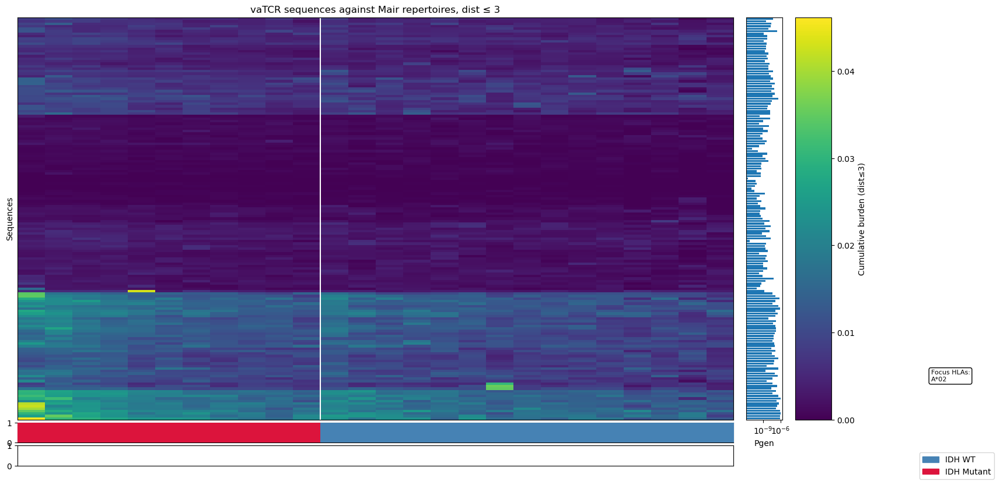

In [16]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob

# ─────────────── CONFIGURATION ───────────────
max_dist       = 3
root_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/vatcr_mair'
matrix_file    = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/mair/mair_glioma_batch_1_metadata.tsv'

# ─────────────── LOAD METADATA & FILTER VALID PATIENTS ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")

# keep rows whose sampleID startswith "CUH"
mask_id = metadata['sampleID'].str.startswith('CUH')

# keep rows where IDH_mutation is either NaN (WT) or exactly "R132H"
mut = metadata['IDH_mutation']
mask_mut = mut.isna() | (mut.str.strip().str.upper() == 'R132H')

filtered = metadata[mask_id & mask_mut]


if filtered.empty:
    raise ValueError("No metadata rows match your CMV/sample_name filters.")

# Build IDH mutation map: 0=WT, 1=mutant. Explicitly test for real NaN and literal NA
# Build IDH mutation map (0 = WT, 1 = R132H)
idh_map = {}
for _, row in filtered.iterrows():
    subject = row['subjectID']                      # ← assign here
    pid     = f"collapsed_mair_{subject}.tsv"       # exact column name

    mut   = row['IDH_mutation']
    is_wt = pd.isna(mut) or str(mut).strip().upper() == 'NA'
    idh_map[pid] = 0 if is_wt else 1

# ─────────────── LOAD BURDEN MATRIX & FILTER TO VALID PATIENTS ───────────────
df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)
df = df[[pid for pid in df.columns if pid in idh_map]]
if df.shape[1] == 0:
    raise ValueError("No patients left after filtering by metadata.")

# ─────────────── ORDER COLUMNS BY HIERARCHICAL GROUPING & BURDEN ───────────────
total_burden = df.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()

mutants = [pid for pid in burden_sorted if idh_map[pid]==1]
wts     = [pid for pid in burden_sorted if idh_map[pid]==0]
ordered_cols = mutants + wts

df = df[ordered_cols]

# Build annotation strips
idh_strip = [idh_map[pid] for pid in ordered_cols]

# ─────────────── MERGE PGEN VALUES ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, 'all_vatcr.tsv')):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())

# ─────────────── CLUSTER SEQUENCES ───────────────
dist_rows   = pdist(df.values, metric='euclidean')
Z_rows      = linkage(dist_rows, method='average')
leaf_order  = dendrogram(Z_rows, no_plot=True)['leaves']
df          = df.iloc[leaf_order, :]
pgen_array  = [pgen_map.get(seq, np.nan) for seq in df.index]

# ─────────────── PLOTTING ───────────────
fig = plt.figure(figsize=(18,11))
gs  = fig.add_gridspec(3,3,
    height_ratios=[20,1,1],
    width_ratios =[20,1,1],
    hspace=0.02, wspace=0.05)

ax_heat = fig.add_subplot(gs[0,0])
ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
ax_cbar = fig.add_subplot(gs[0,2])
ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

# Heatmap
imshow_kwargs = dict(aspect='auto', cmap='viridis')
if df.values.size:
    imshow_kwargs.update(vmin=df.values.min(), vmax=df.values.max())
im = ax_heat.imshow(df.values, **imshow_kwargs)
fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')
ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
ax_heat.set_title(f'vaTCR sequences against Mair repertoires, dist ≤ {max_dist}')
ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

# Pgen bar
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

# IDH strip
ax_idh = fig.add_subplot(gs[1,0], sharex=ax_heat)
cmap_idh = ListedColormap(['steelblue','crimson'])
ax_idh.imshow(np.array(idh_strip)[None,:], aspect='auto',
              cmap=cmap_idh, vmin=0, vmax=1)
ax_idh.set_yticks([]); ax_idh.set_frame_on(False)
ax_idh.set_xticks([])

# Dividers
cuts = [len(mutants)]
for c in cuts: 
    ax_heat.axvline(c-0.5, color='white', lw=1.5)

# Legend
leg_idh = [
    mpatches.Patch(color=cmap_idh(0), label='IDH WT'),
    mpatches.Patch(color=cmap_idh(1), label='IDH Mutant')
]

fig.legend(handles=leg_idh,
              loc='center left', bbox_to_anchor=(0.98,0.2))


fig.subplots_adjust(top=0.9, bottom=0.2, right=0.9)

# Add box showing which focus HLAs
focus_hla_text = "Focus HLAs:\n" + "\n".join(focus_alleles)
fig.text(0.995, 0.35, focus_hla_text,
         fontsize=8, va='top', ha='left',
         bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))


plt.show()

In [ ]:
df = pd.read_csv(matrix_file, index_col='patient_id').T
print("RAW COLUMNS:", df.columns.tolist()[:10])

# if you’ve renamed them, also print the post-rename list:
# df.columns = df.columns.str.replace(r'^collapsed_mair_', '', regex=True)...
print("RENAMED COLUMNS:", df.columns.tolist()[:10])

print("MAP KEYS:", list(idh_map.keys())[:10])


  idh_status  count      mean    median       std       min       max  \
0     Mutant     11  1.156263  1.074649  0.249935  0.870598  1.616347   
1         WT     15  0.905386  0.871454  0.140453  0.678714  1.245849   

        iqr  
0  0.358692  
1  0.170296  


### Now instead of a raw score, shows a normalised score.
- Log base 10 transformed
- Subtract mean divide by standard deviation.

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
from glob import glob

# ─────────────── CONFIGURATION ───────────────
max_dist       = 3
root_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/vatcr_mair'
matrix_file    = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/mair/mair_glioma_batch_1_metadata.tsv'

# ─────────────── LOAD METADATA & FILTER VALID PATIENTS ───────────────
metadata = pd.read_csv(metadata_file, sep="\t")

# keep rows whose sampleID startswith "CUH"
mask_id = metadata['sampleID'].str.startswith('CUH')

# keep rows where IDH_mutation is either NaN (WT) or exactly "R132H"
mut = metadata['IDH_mutation']
mask_mut = mut.isna() | (mut.str.strip().str.upper() == 'R132H')

filtered = metadata[mask_id & mask_mut]


if filtered.empty:
    raise ValueError("No metadata rows match your CMV/sample_name filters.")

# Build IDH mutation map: 0=WT, 1=mutant. Explicitly test for real NaN and literal NA
# Build IDH mutation map (0 = WT, 1 = R132H)
idh_map = {}
for _, row in filtered.iterrows():
    subject = row['subjectID']                      # ← assign here
    pid     = f"collapsed_mair_{subject}.tsv"       # exact column name

    mut   = row['IDH_mutation']
    is_wt = pd.isna(mut) or str(mut).strip().upper() == 'NA'
    idh_map[pid] = 0 if is_wt else 1

# [ ... same setup code as before ... loading metadata, filtering, idh_map creation ... ]

# ─────────────── LOAD BURDEN MATRIX & FILTER TO VALID PATIENTS ───────────────
df = pd.read_csv(matrix_file, index_col='patient_id').T
df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

# Log10 transform to reduce skew (add pseudocount to avoid log10(0))
df = np.log10(df + 1e-6)

df = df[[pid for pid in df.columns if pid in idh_map]]
if df.shape[1] == 0:
    raise ValueError("No patients left after filtering by metadata.")

# ─────────────── NORMALIZE ACROSS ROWS ───────────────
df_norm = (
    df
    .sub(df.mean(axis=1), axis=0)
    .div(df.std(axis=1), axis=0)
    .fillna(0.0)
)

# ─────────────── ORDER COLUMNS BY HIERARCHICAL GROUPING & BURDEN ───────────────
total_burden = df_norm.sum(axis=0)
burden_sorted = total_burden.sort_values(ascending=False).index.tolist()

mutants = [pid for pid in burden_sorted if idh_map[pid]==1]
wts     = [pid for pid in burden_sorted if idh_map[pid]==0]
ordered_cols = mutants + wts

df_norm = df_norm[ordered_cols]  # <- use normalized matrix here

# Build annotation strips
idh_strip = [idh_map[pid] for pid in ordered_cols]

# ─────────────── MERGE PGEN VALUES ───────────────
pgen_map = {}
for file in glob(os.path.join(pgen_dir, 'all_vatcr.tsv')):
    sub_df = pd.read_csv(file, sep='\t').set_index('Sequence')
    pgen_map.update(sub_df['Pgen'].to_dict())

# ─────────────── CLUSTER SEQUENCES (based on normalized burden) ───────────────
dist_rows   = pdist(df_norm.values, metric='euclidean')
Z_rows      = linkage(dist_rows, method='average')
leaf_order  = dendrogram(Z_rows, no_plot=True)['leaves']
df_norm     = df_norm.iloc[leaf_order, :]
pgen_array  = [pgen_map.get(seq, np.nan) for seq in df_norm.index]


# ─────────────── PLOTTING (with patient IDs) ───────────────
fig = plt.figure(figsize=(18,11))
gs  = fig.add_gridspec(3,3,
    height_ratios=[20,1,1],
    width_ratios =[20,1,1],
    hspace=0.02, wspace=0.05)

ax_heat = fig.add_subplot(gs[0,0])
ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
ax_cbar = fig.add_subplot(gs[0,2])
ax_idh  = fig.add_subplot(gs[1,0], sharex=ax_heat)
ax_blank = fig.add_subplot(gs[2,0], sharex=ax_heat)
ax_blank.axis('off')

# Heatmap
vmax = np.nanmax(np.abs(df_norm.values))
vmin = -vmax
im = ax_heat.imshow(df_norm.values, aspect='auto', cmap='bwr', vmin=vmin, vmax=vmax)

# colorbar
fig.colorbar(im, cax=ax_cbar, label='Normalized burden (z-score)')

# show patient IDs on x-axis
ax_heat.set_xticks(np.arange(len(ordered_cols)))
ax_heat.set_xticklabels(ordered_cols, rotation=90, fontsize=8)
ax_heat.set_yticks([])  
ax_heat.set_ylabel('Sequences')
ax_heat.set_title(f'Normalized vaTCR burden, dist ≤ {max_dist}')

# Pgen bar
ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
ax_pgen.invert_yaxis()
ax_pgen.set_xlabel('Pgen')
ax_pgen.set_xscale('log')
ax_pgen.set_yticks([])

# IDH strip
cmap_idh = ListedColormap(['steelblue','crimson'])
ax_idh.imshow(np.array(idh_strip)[None,:], aspect='auto',
              cmap=cmap_idh, vmin=0, vmax=1)
ax_idh.set_yticks([])
ax_idh.set_frame_on(False)
ax_idh.set_xticks([])

# divider line between mutants & WTs
cuts = [len(mutants)]
for c in cuts: 
    ax_heat.axvline(c-0.5, color='white', lw=1.5)

# legend
leg_idh = [
    mpatches.Patch(color=cmap_idh(0), label='IDH WT'),
    mpatches.Patch(color=cmap_idh(1), label='IDH Mutant')
]
fig.legend(handles=leg_idh,
           loc='center left', bbox_to_anchor=(0.98,0.2))

fig.subplots_adjust(top=0.9, bottom=0.3, right=0.9)
plt.show()




KeyError: 'sampleID'

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_21835/2571099958.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot([wt_scores, mut_scores],


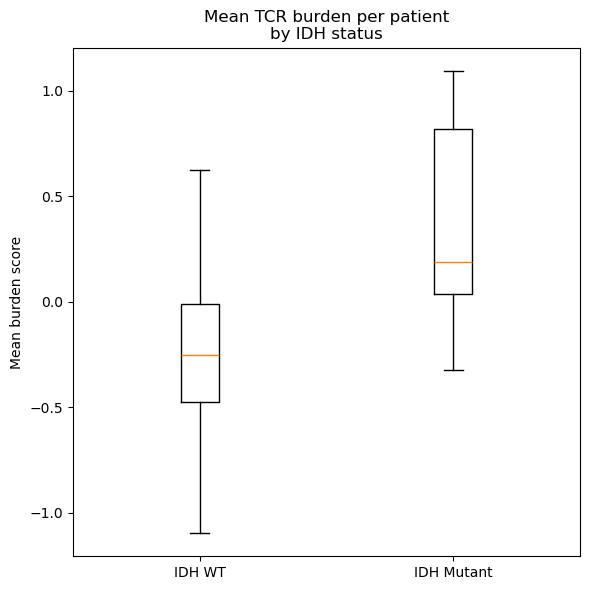

                    patient_id  mean_score idh_status
0   collapsed_mair_CUH-014.tsv    1.095201     Mutant
5   collapsed_mair_CUH-112.tsv    0.187724     Mutant
3   collapsed_mair_CUH-113.tsv    0.756429     Mutant
2   collapsed_mair_CUH-123.tsv    0.879663     Mutant
8   collapsed_mair_CUH-129.tsv   -0.018550     Mutant
4   collapsed_mair_CUH-132.tsv    0.401314     Mutant
10  collapsed_mair_CUH-160.tsv   -0.322703     Mutant
7   collapsed_mair_CUH-163.tsv    0.090351     Mutant
1   collapsed_mair_CUH-165.tsv    1.050560     Mutant
9   collapsed_mair_CUH-186.tsv   -0.168776     Mutant
6   collapsed_mair_CUH-193.tsv    0.177000     Mutant
11  collapsed_mair_CUH-037.tsv    0.623609         WT
23  collapsed_mair_CUH-114.tsv   -0.796127         WT
18  collapsed_mair_CUH-119.tsv   -0.252581         WT
14  collapsed_mair_CUH-124.tsv    0.012468         WT
15  collapsed_mair_CUH-126.tsv   -0.029019         WT
20  collapsed_mair_CUH-135.tsv   -0.316684         WT
17  collapsed_mair_CUH-141.t

In [6]:
import matplotlib.pyplot as plt

# Compute each patient’s mean (you can choose df or df_norm; here we use raw df)
mean_score = df_norm.mean(axis=0)

# Build a DataFrame for plotting
bp_df = pd.DataFrame({
    'patient_id': mean_score.index,
    'mean_score': mean_score.values,
    'idh_status': [ 'WT' if idh_map[pid]==0 else 'Mutant'
                    for pid in mean_score.index ]
})

# Separate the groups
wt_scores  = bp_df.loc[bp_df['idh_status']=='WT',  'mean_score']
mut_scores = bp_df.loc[bp_df['idh_status']=='Mutant', 'mean_score']

# Plot
fig, ax = plt.subplots(figsize=(6,6))
ax.boxplot([wt_scores, mut_scores],
           labels=['IDH WT', 'IDH Mutant'],
           notch=False)
ax.set_ylabel('Mean burden score')
ax.set_title('Mean TCR burden per patient\nby IDH status')
plt.tight_layout()
plt.show()

print(bp_df.sort_values(by=['idh_status', 'patient_id']))


### ROC curve classifying based just on mean score for vaTCR v Mair

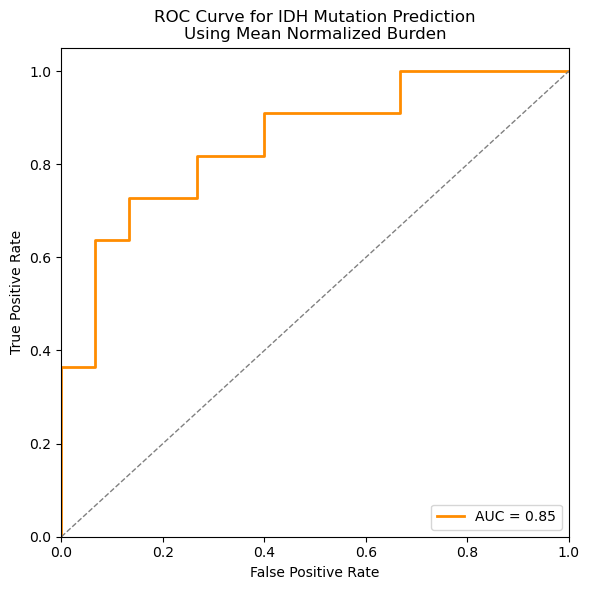

In [7]:
import pandas as pd
import numpy as np
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# 1. Get mean normalized score per patient
mean_score = df_norm.mean(axis=0)

# 2. Create dataframe with labels
roc_df = pd.DataFrame({
    'patient_id': mean_score.index,
    'mean_score': mean_score.values,
    'idh_label': [idh_map[pid] for pid in mean_score.index]  # 0=WT, 1=Mutant
})

# 3. Compute ROC curve
fpr, tpr, thresholds = roc_curve(roc_df['idh_label'], roc_df['mean_score'])
roc_auc = auc(fpr, tpr)

# 4. Plot ROC
plt.figure(figsize=(6,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for IDH Mutation Prediction\nUsing Mean Normalized Burden')
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()


I want to see a given highconf list against Emerson repertoires, AND Mair repertoires. First, MAIR

# Mean normalised burden ROC for all 4 highconf against Mair


=== VATCR (root: /Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/vatcr_mair_top10000) ===


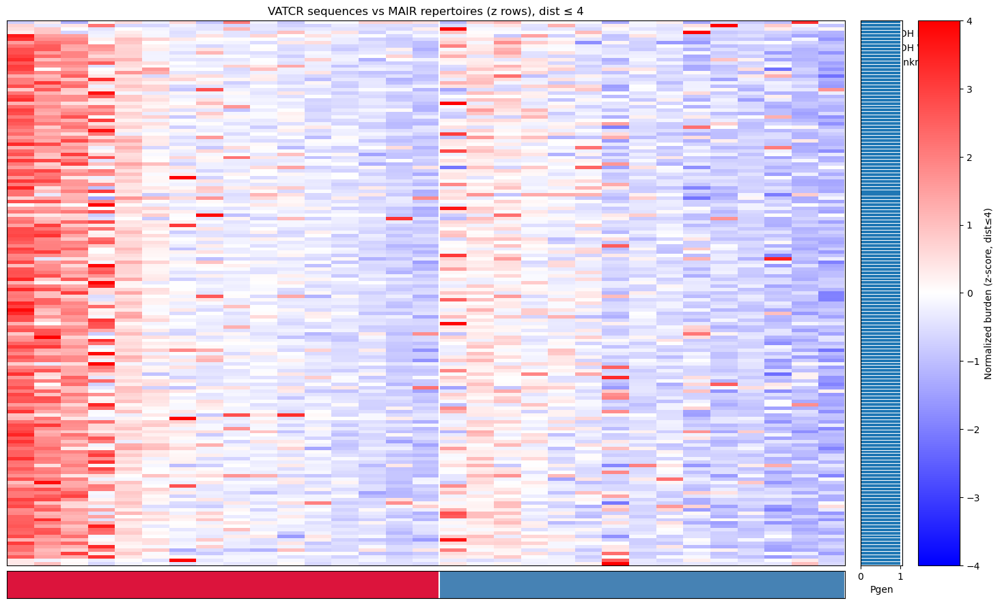

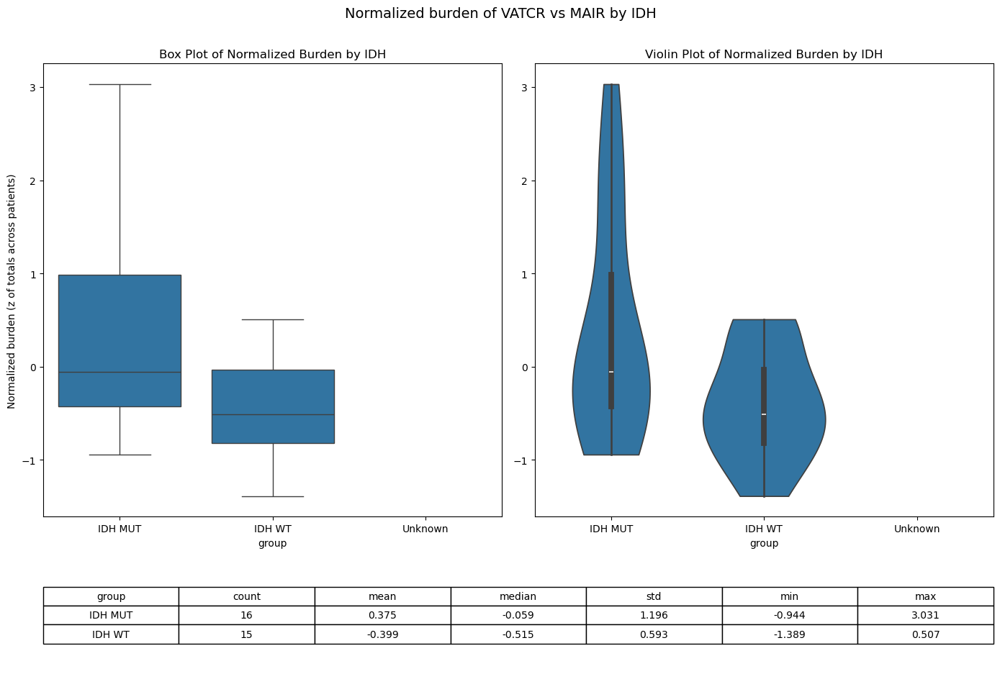

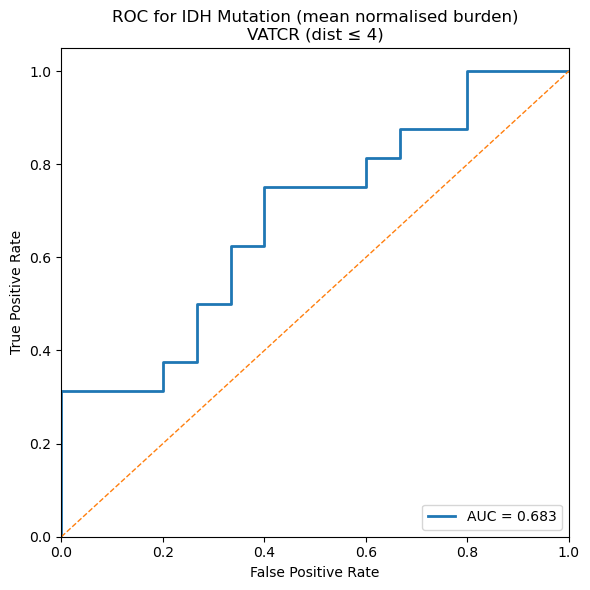


=== INVITRO (root: /Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/invitro_mair_top10000) ===


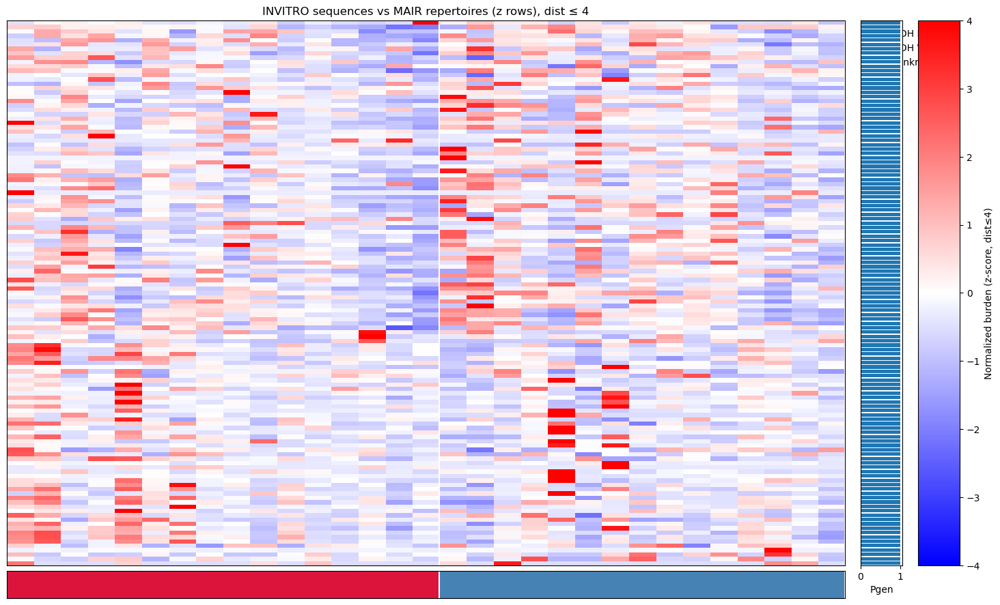

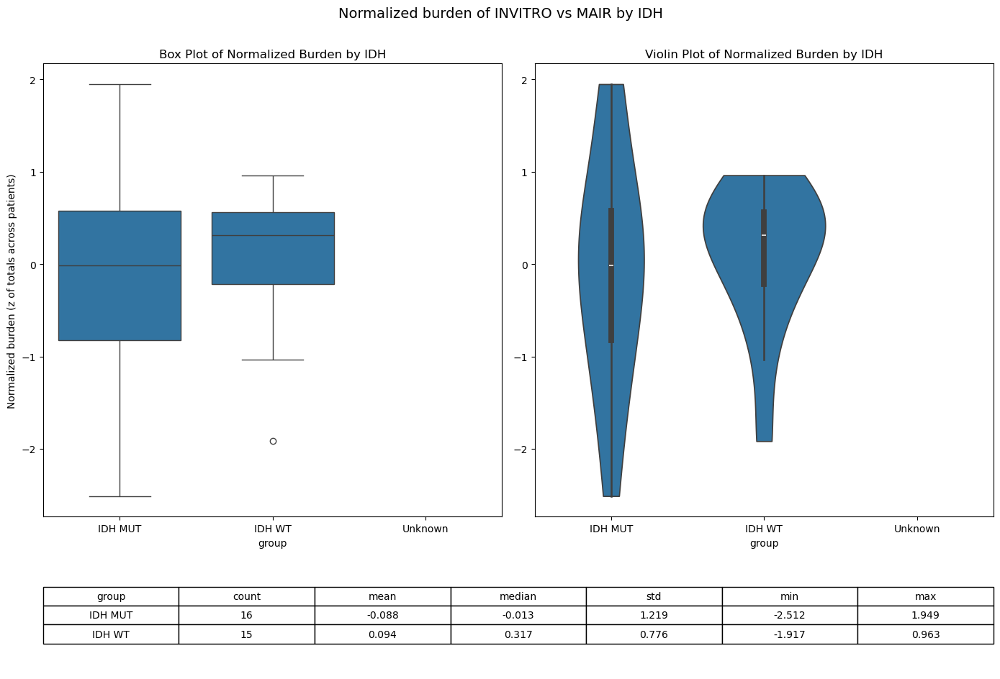

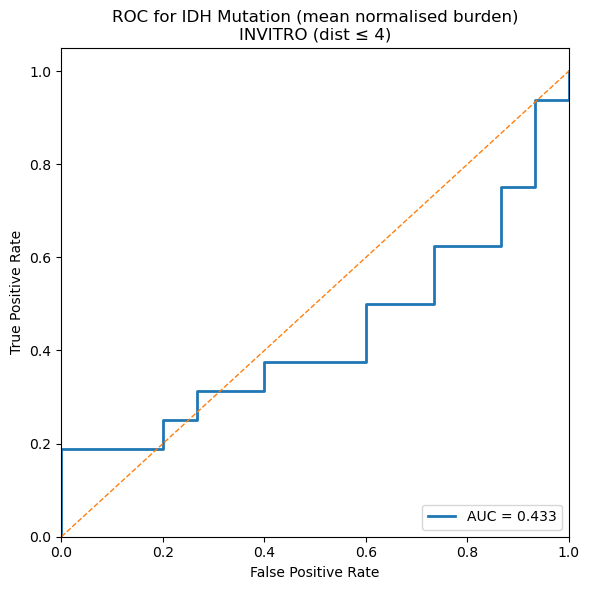


=== AC02 (root: /Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/ac02_mair_top10000) ===


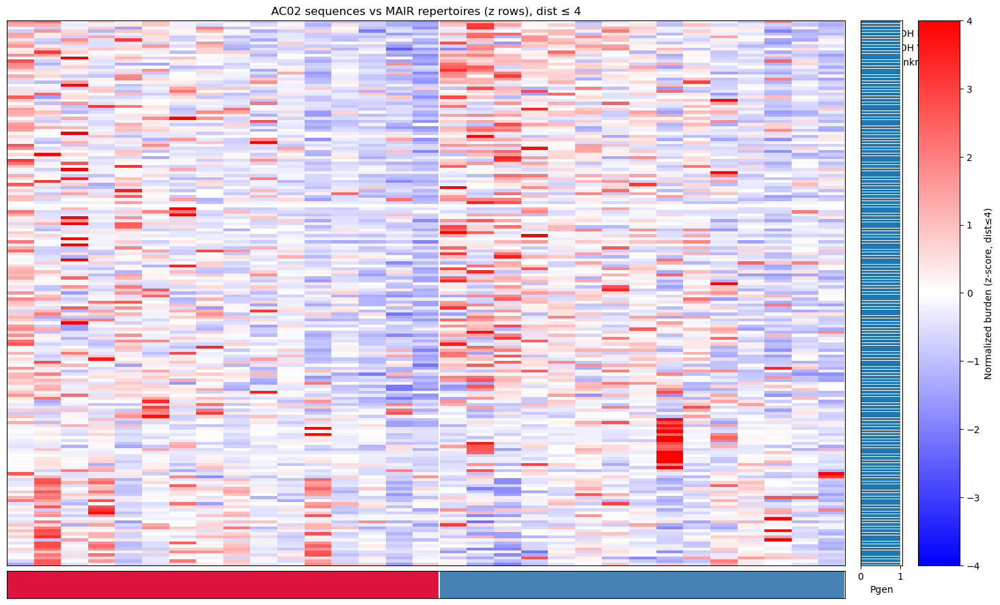

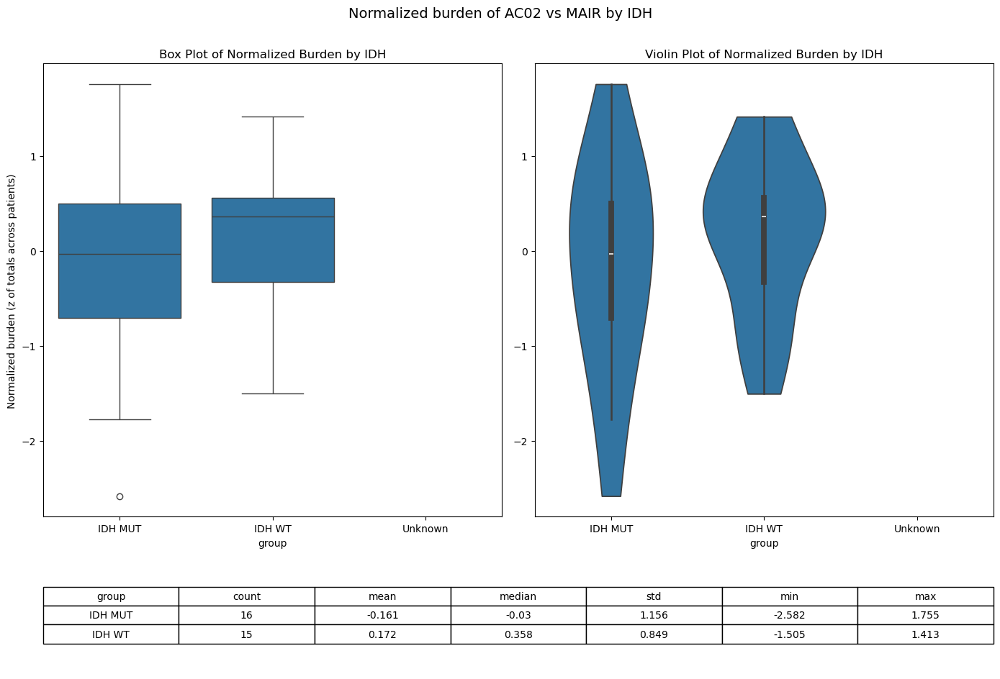

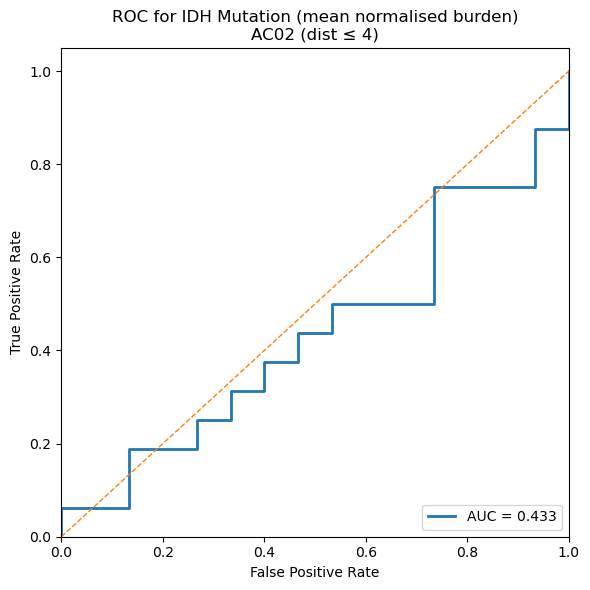


=== RANDOM_VDJDB (root: /Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/random_vdjdb_mair_top10000) ===


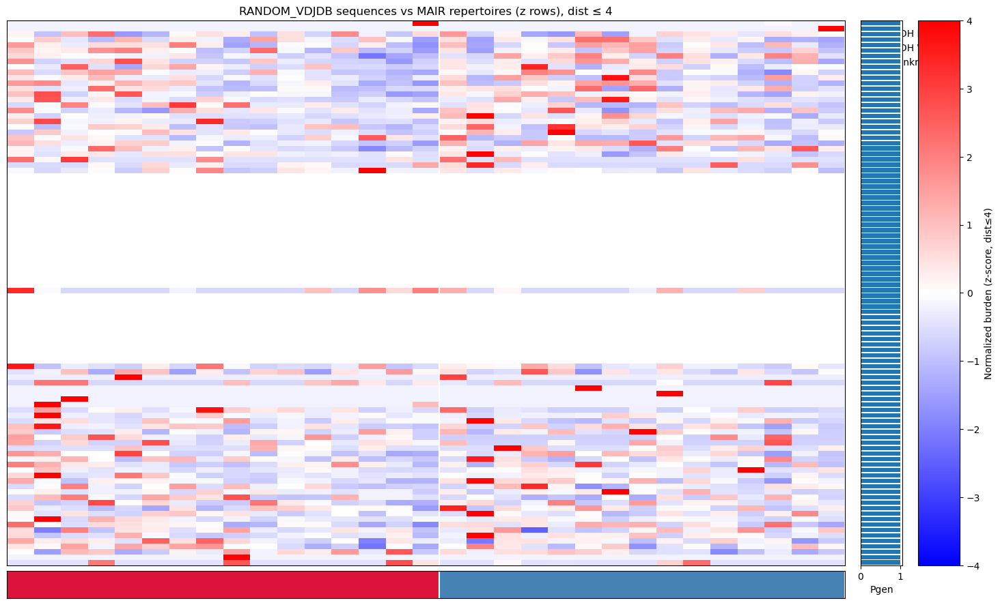

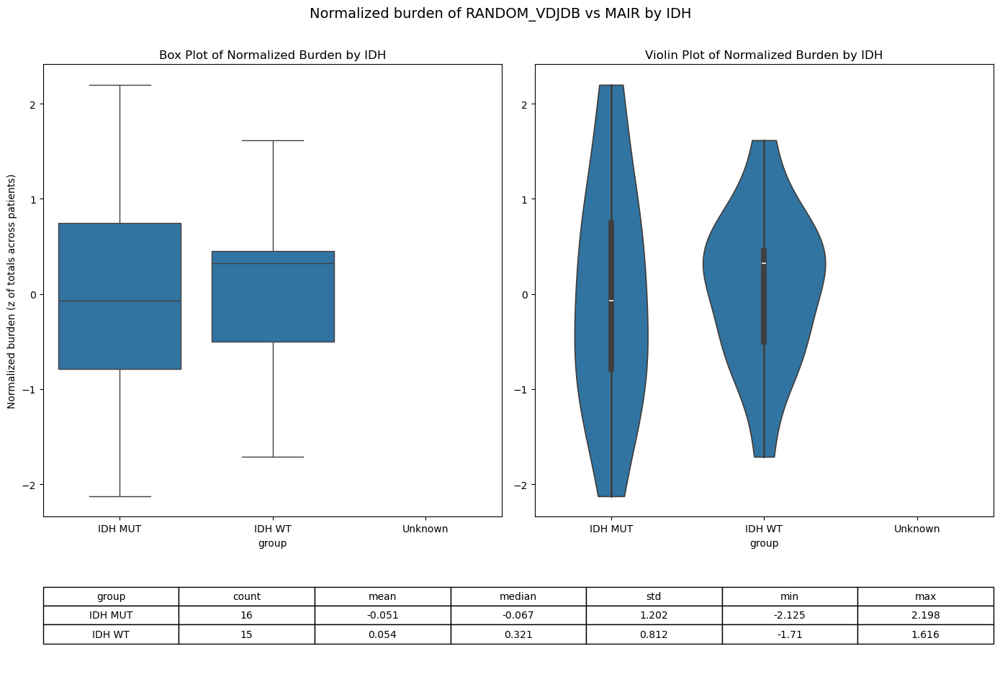

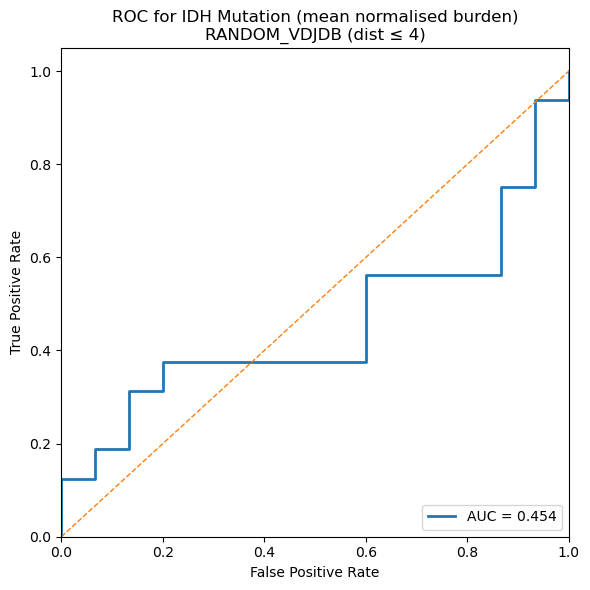


=== RANDOM_OLGA (root: /Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/random_olga_mair_top10000) ===


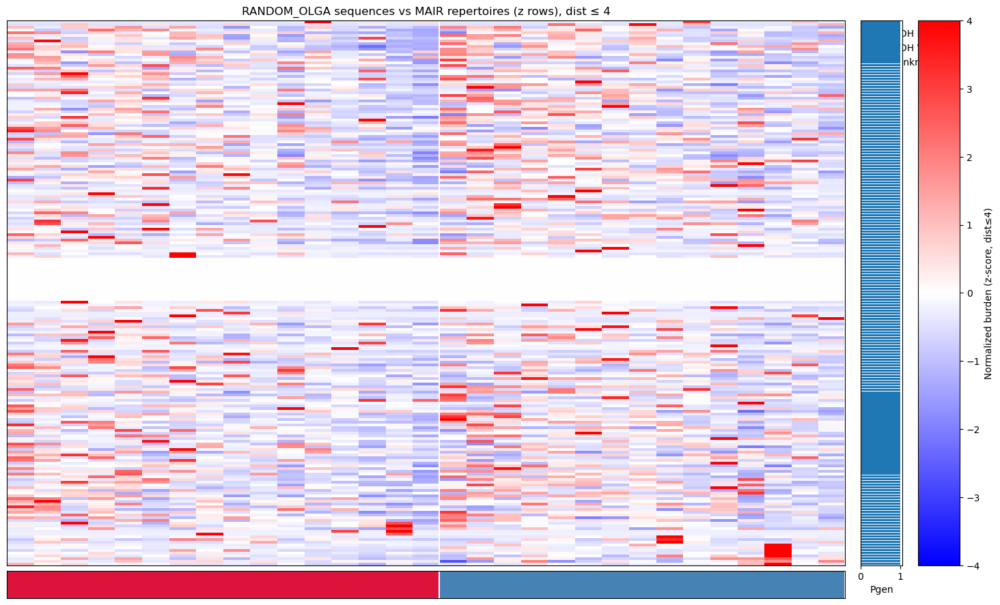

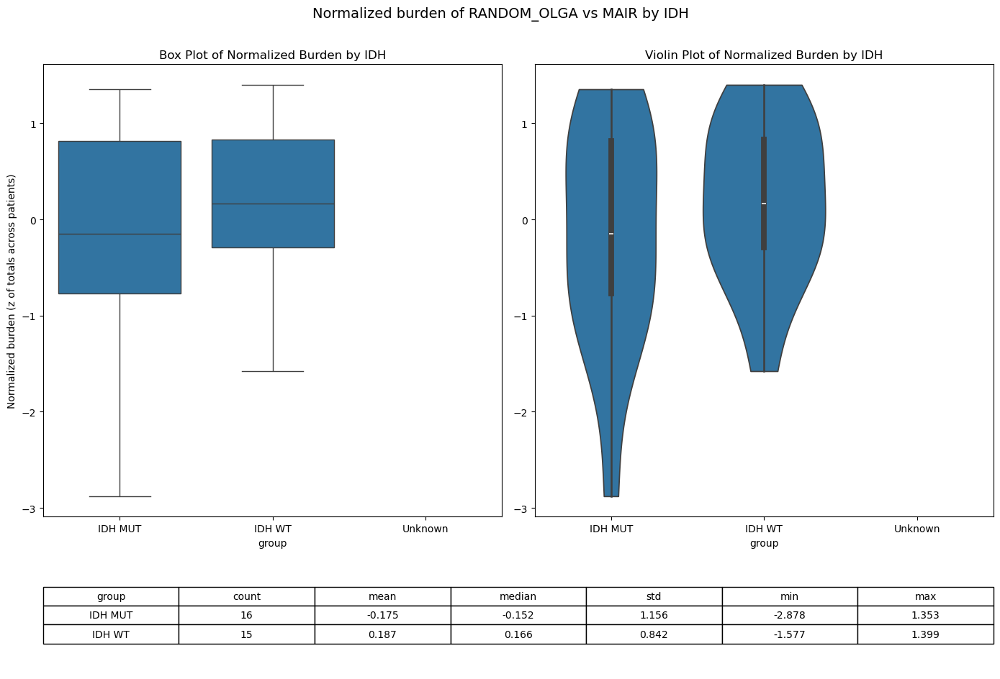

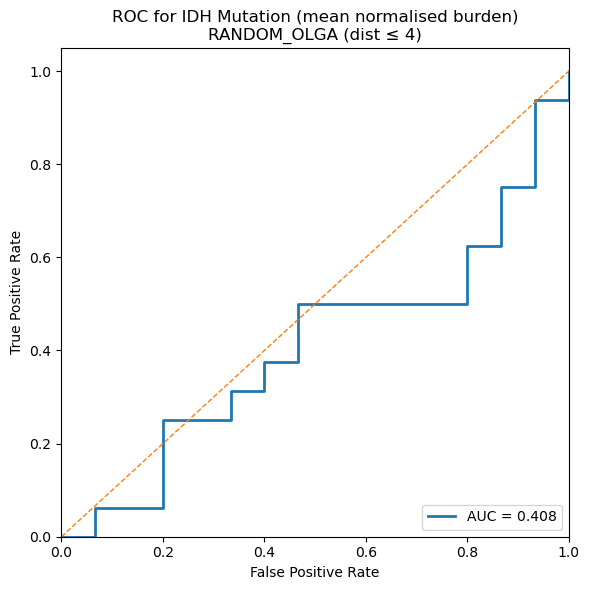

In [19]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap, TwoSlopeNorm
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist
from collections import OrderedDict
from sklearn.metrics import roc_curve, auc

# ─────────────── CONFIG ───────────────
max_dist      = 4
cap           = 4                   # z-score clipping for display (±cap)
highconf_list = ['vatcr', 'invitro','ac02', 'random_vdjdb', 'random_olga']
rep_label = "mair_top10000"   # <-- set to "mair" or "mair_top10000"

# per-highconf matrices expected at:
#   {base_heat_dir}/{highconf}_mair/all_dist_{d}_matrix.csv, d=0..max_dist
base_heat_dir = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output'

# MAIR metadata (TSV) with at least: sampleID, IDH
idh_meta_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/mair/mair_glioma_batch_1_metadata.tsv'

# ─────────────── IO HELPERS ───────────────
def load_cumulative_matrix(root_dir: str, hla_code: str = 'all', max_dist: int = 4) -> pd.DataFrame:
    """Sum burden matrices for d = 0..max_dist. Rows=sequences, Cols=patients."""
    pieces = []
    for d in range(max_dist + 1):
        path = os.path.join(root_dir, f'{hla_code}_dist_{d}_matrix.csv')
        if not os.path.exists(path):
            raise FileNotFoundError(f"Missing file: {path}")
        df = pd.read_csv(path, index_col='patient_id').T
        df = df.apply(pd.to_numeric, errors='coerce').fillna(0.0)
        pieces.append(df)
    return sum(pieces) if pieces else pd.DataFrame()

def build_panel(root_dir: str, max_dist: int):
    df = load_cumulative_matrix(root_dir, 'all', max_dist)
    sorted_cols = df.sum(axis=0).sort_values(ascending=False).index.tolist()
    return df[sorted_cols], sorted_cols


# ─────────────── NORMALIZE / CLUSTER ───────────────
def normalize_rows(df: pd.DataFrame) -> pd.DataFrame:
    """Row-wise z-score; NaNs→0."""
    if df.empty: return df.copy()
    return df.sub(df.mean(axis=1), axis=0).div(df.std(axis=1), axis=0).fillna(0.0)

def cluster_rows(df_z: pd.DataFrame, method='average', criterion='maxclust', t=5):
    """Cluster by Euclidean on z-scored rows; reorder by (cluster asc, mean_z desc)."""
    if df_z.shape[0] < 2:
        info = {'min_dist': np.nan, 'max_dist': np.nan, 'method': method,
                'criterion': criterion, 'threshold': t,
                'num_clusters': int(df_z.shape[0] > 0), 'cluster_sizes': {}}
        return df_z, info
    dist_condensed = pdist(df_z.values, metric='euclidean')
    Z = linkage(dist_condensed, method=method)
    clusters = fcluster(Z, t=t, criterion=criterion)
    tmp = pd.DataFrame({'cluster': clusters, 'mean_z': df_z.mean(axis=1)}, index=df_z.index)
    new_index = tmp.sort_values(['cluster', 'mean_z'], ascending=[True, False]).index
    df_reordered = df_z.loc[new_index]
    info = {'min_dist': float(dist_condensed.min()), 'max_dist': float(dist_condensed.max()),
            'method': method, 'criterion': criterion, 'threshold': t,
            'num_clusters': int(tmp['cluster'].nunique()),
            'cluster_sizes': dict(pd.Series(clusters).value_counts().sort_index())}
    return df_reordered, info

# ─────────────── IDH MAPPING ───────────────
def load_idh_map_from_mair_meta(path: str) -> dict:
    """
    Return { base_patient_id -> 'mut'|'wt' } where base_patient_id is like 'CUH-145'.
    If both R1 and R2 exist, prefer R1.
    """
    meta = pd.read_csv(path, sep='\t')
    for col in ('sampleID', 'IDH'):
        if col not in meta.columns:
            raise ValueError(f"Metadata missing required column: {col}")

    def norm_idh(v):
        s = str(v).strip().lower()
        if s in {'mut','m','1','mutant','r132h','r132c','idhm','idh-mut'}:
            return 'mut'
        if s in {'wt','w','0','wildtype','idhw','idh-wt','na'}:
            return 'wt'
        return None

    by_base = {}
    for _, r in meta.iterrows():
        sample = str(r['sampleID']).strip()     # e.g. CUH-145-R1
        parts = sample.split('-')
        if len(parts) < 3: continue
        base = '-'.join(parts[:2])              # CUH-145
        rep  = parts[-1].upper()                # R1 or R2
        idh  = norm_idh(r['IDH'])
        if idh is None: continue
        if base not in by_base:
            by_base[base] = {'R1': None, 'R2': None}
        if rep in ('R1','R2'):
            by_base[base][rep] = idh

    final_map = {}
    for base, reps in by_base.items():
        final_map[base] = reps['R1'] if reps['R1'] is not None else reps['R2']
    return final_map

def idh_for_column(col_name: str, idh_map: dict):
    """Map 'collapsed_mair_CUH-145.tsv' → 'mut'/'wt'/None using idh_map."""
    base = os.path.basename(str(col_name)).replace('collapsed_mair_', '').replace('.tsv', '')
    return idh_map.get(base)

def make_idh_strip(columns, idh_map):
    """Encode strip aligned to columns: 0=Unknown, 1=WT, 2=MUT."""
    enc = {'wt':1, 'mut':2}
    return np.array([enc.get(idh_for_column(c, idh_map), 0) for c in columns], dtype=int)

# ─────────────── COLUMN GROUPING (fixed) ───────────────
def _sort_subset(totals: pd.Series, cols: list[str]) -> list[str]:
    if not cols:
        return []
    cols = [c for c in cols if c in totals.index]
    if not cols:
        return []
    return list(totals.loc[cols].sort_values(ascending=False).index)

def group_and_order_columns(df_norm: pd.DataFrame, idh_map: dict):
    """
    Group columns by IDH (MUT → WT → Unknown).
    Within each group, order by total normalized burden (desc).
    Returns ordered columns and block sizes (for vertical separators).
    """
    totals = df_norm.sum(axis=0)
    groups = {'mut': [], 'wt': [], 'na': []}
    for c in df_norm.columns:
        s = idh_for_column(c, idh_map)
        if s == 'mut':
            groups['mut'].append(c)
        elif s == 'wt':
            groups['wt'].append(c)
        else:
            groups['na'].append(c)

    mut_cols = _sort_subset(totals, groups['mut'])
    wt_cols  = _sort_subset(totals, groups['wt'])
    na_cols  = _sort_subset(totals, groups['na'])

    ordered = mut_cols + wt_cols + na_cols
    blocks  = (len(mut_cols), len(wt_cols), len(na_cols))
    return ordered, blocks

# ─────────────── PLOTTING ───────────────
def plot_heatmap_with_idh(df_norm: pd.DataFrame, idh_strip: np.ndarray, blocks, title: str, max_dist: int, cap: int):
    """
    Heatmap of row-wise z with ±cap clipping and IDH strip under the heatmap.
    Columns are already ordered.
    """
    df_display = df_norm.clip(-cap, cap)
    norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)

    fig = plt.figure(figsize=(18, 11))
    gs = fig.add_gridspec(2, 3, height_ratios=[20, 1], width_ratios=[20, 1, 1],
                          hspace=0.02, wspace=0.05)

    ax_heat = fig.add_subplot(gs[0, 0])
    ax_pgen = fig.add_subplot(gs[0, 1], sharey=ax_heat)  # placeholder to mirror your earlier layout
    ax_cbar = fig.add_subplot(gs[0, 2])
    ax_idh  = fig.add_subplot(gs[1, 0], sharex=ax_heat)

    im = ax_heat.imshow(df_display.values, aspect='auto', cmap='bwr', norm=norm)
    ax_heat.set_title(title)
    ax_heat.set_yticks([])
    ax_heat.set_xticks(range(df_norm.shape[1]))
    ax_heat.set_xticklabels(df_norm.columns, rotation=90, fontsize=6, ha='center')
    ax_heat.tick_params(axis='x', length=2)
    fig.colorbar(im, cax=ax_cbar, label=f'Normalized burden (z-score, dist≤{max_dist})')

    # pgen placeholder
    ax_pgen.barh(np.arange(df_norm.shape[0]), np.ones(df_norm.shape[0]), align='center')
    ax_pgen.invert_yaxis()
    ax_pgen.set_xlabel('Pgen')
    ax_pgen.set_yticks([])

    # IDH strip
    cmap_idh = ListedColormap(['lightgrey', 'steelblue', 'crimson'])  # 0=Unknown, 1=WT, 2=MUT
    ax_idh.imshow(idh_strip[np.newaxis, :], aspect='auto', cmap=cmap_idh, vmin=0, vmax=2)
    ax_idh.set_yticks([]); ax_idh.set_xticks([])

    # vertical separators between (MUT | WT | Unknown)
    m, w, n = blocks
    cuts = np.cumsum([m, w, n])
    for c in cuts[:-1]:
        for ax in (ax_heat, ax_idh):
            ax.axvline(c - 0.5, color='white', lw=1.5)

    # legend
    handles = [mpatches.Patch(color=cmap_idh(2/2), label='IDH MUT'),
               mpatches.Patch(color=cmap_idh(1/2), label='IDH WT'),
               mpatches.Patch(color=cmap_idh(0/2), label='Unknown')]
    ax_heat.legend(handles=handles, loc='upper left', bbox_to_anchor=(1.02, 1.0), frameon=False)

    plt.show()

def plot_summary_panel_idh(df_norm: pd.DataFrame, idh_map: dict, highconf: str):
    """
    Summary using *normalized (z-scored)* burden per patient:
      1) compute per-patient totals from df_norm (rows already z-scored),
      2) z-score those totals across patients,
      3) plot box/violin and compute stats on the z-scored totals.
    """
    # 1) total burden per patient (columns)
    totals = df_norm.sum(axis=0)

    # 2) z-score across patients → "normalized burden"
    if totals.std(ddof=0) == 0:
        norm_burden = (totals - totals.mean())  # all equal → centered at 0
    else:
        norm_burden = (totals - totals.mean()) / totals.std(ddof=0)

    # group label from column name
    def grp(col):
        s = idh_for_column(col, idh_map)
        if s == 'mut': return 'IDH MUT'
        if s == 'wt':  return 'IDH WT'
        return 'Unknown'

    summary = pd.DataFrame({
        'patient_id': totals.index,
        'normalized_burden': norm_burden.values,
        'group': [grp(c) for c in totals.index]
    })
    group_order = ['IDH MUT', 'IDH WT', 'Unknown']
    summary['group'] = pd.Categorical(summary['group'], categories=group_order, ordered=True)

    # stats on the normalized burden
    stats = summary.groupby('group', observed=True)['normalized_burden'].agg(
        count='count', mean='mean', median='median', std='std', min='min', max='max'
    ).reset_index()
    stats_display = stats.copy()
    if not stats_display.empty:
        stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    # y-lims
    vals = summary['normalized_burden'].dropna().to_numpy()
    if vals.size:
        y_lo = vals.min() - 0.05*(vals.max()-vals.min())
        y_hi = vals.max() + 0.05*(vals.max()-vals.min())
    else:
        y_lo, y_hi = (-1, 1)

    import seaborn as sns
    from matplotlib import gridspec
    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])
    ax_box    = fig.add_subplot(gs[0, 0])
    ax_violin = fig.add_subplot(gs[0, 1], sharey=ax_box)
    ax_table  = fig.add_subplot(gs[1, :])

    sns.boxplot(data=summary, x='group', y='normalized_burden', order=group_order, ax=ax_box)
    ax_box.set_ylim(y_lo, y_hi)
    ax_box.set_title('Box Plot of Normalized Burden by IDH')
    ax_box.set_ylabel('Normalized burden (z of totals across patients)')

    sns.violinplot(data=summary, x='group', y='normalized_burden', order=group_order, cut=0, inner='box', ax=ax_violin)
    ax_violin.set_ylim(y_lo, y_hi)
    ax_violin.set_title('Violin Plot of Normalized Burden by IDH')
    ax_violin.set_ylabel('')

    ax_table.axis('off')
    table = ax_table.table(
        cellText=stats_display.values if not stats_display.empty else [['']*len(['group','count','mean','median','std','min','max'])],
        colLabels=stats_display.columns if not stats_display.empty else ['group','count','mean','median','std','min','max'],
        cellLoc='center', loc='center'
    )
    table.auto_set_font_size(False); table.set_fontsize(10); table.scale(1, 1.4)

    plt.suptitle(f'Normalized burden of {highconf.upper()} vs MAIR by IDH', fontsize=14, y=0.94)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

# ─────────────── NEW: ROC FOR IDH ───────────────
def plot_idh_roc_from_df(df_norm: pd.DataFrame, idh_map: dict, title_suffix: str):
    """
    Build an IDH-labelled ROC from the per-patient mean normalised burden.
    Labels: 0 = WT, 1 = MUT.
    """
    if df_norm.empty:
        print("[INFO] Skipping IDH ROC (no data).")
        return

    # Score per patient (mean of row-wise z across sequences)
    mean_score = df_norm.mean(axis=0)

    # Align to columns with known IDH labels
    labels, scores = [], []
    for col in mean_score.index:
        s = idh_for_column(col, idh_map)   # 'mut' / 'wt' / None
        if s == 'mut':
            labels.append(1)
            scores.append(float(mean_score[col]))
        elif s == 'wt':
            labels.append(0)
            scores.append(float(mean_score[col]))
        # else: unknown → skip

    if len(set(labels)) < 2:
        print("[INFO] Skipping IDH ROC (need both WT and MUT).")
        return

    fpr, tpr, _ = roc_curve(np.array(labels, dtype=int), np.array(scores, dtype=float))
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, lw=2, label=f'AUC = {roc_auc:.3f}')
    plt.plot([0, 1], [0, 1], lw=1, linestyle='--')
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title(f'ROC for IDH Mutation (mean normalised burden)\n{title_suffix}')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()

# ─────────────── MAIN LOOP ───────────────
idh_map_all = load_idh_map_from_mair_meta(idh_meta_file)

for highconf in highconf_list:
    root_dir = os.path.join(base_heat_dir, f'{highconf}_{rep_label}')
    print(f"\n=== {highconf.upper()} (root: {root_dir}) ===")
    if not os.path.isdir(root_dir):
        print(f"[ERROR] Directory not found: {root_dir} — skipping.")
        continue

    try:
        big_df_raw, _ = build_panel(root_dir, max_dist)
    except FileNotFoundError as e:
        print(f"[ERROR] {e} — skipping {highconf}.")
        continue

    if big_df_raw.empty:
        print("[WARN] No data matrices found — skipping.")
        continue

    # normalize rows (z)
    big_df_z = normalize_rows(big_df_raw)

    # cluster rows, keep column order for now
    big_df_z, diag = cluster_rows(big_df_z, method='average', criterion='maxclust', t=5)

    # GROUP columns by IDH status (MUT → WT → Unknown), and within-group by total z-burden
    ordered_cols, blocks = group_and_order_columns(big_df_z, idh_map_all)
    big_df_z = big_df_z[ordered_cols]

    # Build IDH strip aligned to ordered columns
    idh_strip = make_idh_strip(big_df_z.columns, idh_map_all)

    # Heatmap + IDH strip
    title = f'{highconf.upper()} sequences vs MAIR repertoires (z rows), dist ≤ {max_dist}'
    plot_heatmap_with_idh(big_df_z, idh_strip, blocks, title, max_dist, cap)

    # Summary panel (uses normalized burden across patients)
    plot_summary_panel_idh(big_df_z, idh_map_all, highconf)

    # NEW: IDH ROC
    plot_idh_roc_from_df(
        big_df_z,
        idh_map_all,
        title_suffix=f'{highconf.upper()} (dist ≤ {max_dist})'
    )
